In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]= '1'
import numpy as np
from scipy.io import loadmat, savemat
from copy import deepcopy
import matplotlib.pyplot as plt
import src.fitting as fitting
import statsmodels.api as sm
import torch
import gpytorch
from gpytorch.means import ConstantMean
from gpytorch.kernels import RBFKernel
from gpytorch.likelihoods import GaussianLikelihood
from mpl_toolkits.mplot3d import Axes3D
from copy import deepcopy

%matplotlib inline

In [2]:
def sample_spikes(spikes, t):
    # Important: assumes spikes is shuffled
    """
    Helper function to sample spikes from a Bernoulli distribution.

    Parameters:
    spikes (np.ndarray AMPLITUDES X trials): possibly jagged array of spiking trials for a given (cell, pattern)
    t (np.ndarray AMPLITUDES X 1): Number of trials across amplitudes for a given (cell, pattern)

    Returns:
    p_empirical_array (np.ndarray): Empirical probability of a spike across
                              amplitude for a given (cell, pattern)
    """
    assert len(spikes) == len(t), "Number of amplitudes does not match number of trials"
    t = np.array(t).astype(int)
    
    p_empirical = np.zeros(len(t))
    for i in range(len(t)):
        # If there are no trials, set the empirical probability to 0.5
        if t[i] == 0:
            p_empirical[i] = 0.5
        else:
            if t[i] <= len(spikes[i]):
                p_empirical[i] = np.mean(spikes[i][:t[i]])
            else:
                p_empirical[i] = np.mean(spikes[i])
        
    return p_empirical

In [3]:
def sample_spikes_array(all_spikes, trials):
    """
    Sample spikes across all cells and patterns using multiprocessing.

    Parameters:
    all_spikes (np.ndarray CELLS X 1): spikes for all cells and patterns
    trials (np.ndarray AMPLITUDES x 1): Number of trials

    Returns:
    p_empirical_array (np.ndarray CELLS X AMPLITUDES): Empirical probability of a spike across
                                    all cells and patterns
    """

    # Set up a list for multiprocessing
    probs_empirical_array = np.zeros((len(all_spikes), len(trials)))
    for i in range(len(all_spikes)):
        probs_empirical_array[i] = sample_spikes(all_spikes[i], trials)
    
    return probs_empirical_array

In [4]:
def global_selectivity(probs_2d):
    target_probs = np.max(probs_2d, axis=0)
    target_inds = np.argmax(probs_2d, axis=0)
    selectivity = np.zeros_like(target_probs)

    for i, ind in enumerate(target_inds):
        other_inds = np.setdiff1d(np.arange(len(probs_2d)), ind)
        selectivity[i] = target_probs[i] * (1 - np.amax(probs_2d[other_inds, i]))
    
    return selectivity

311 218


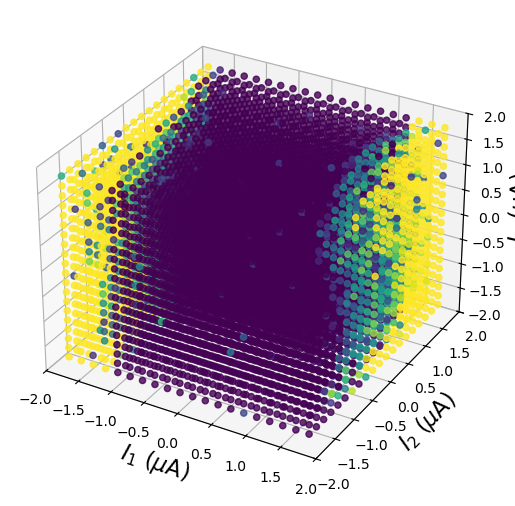

311 222


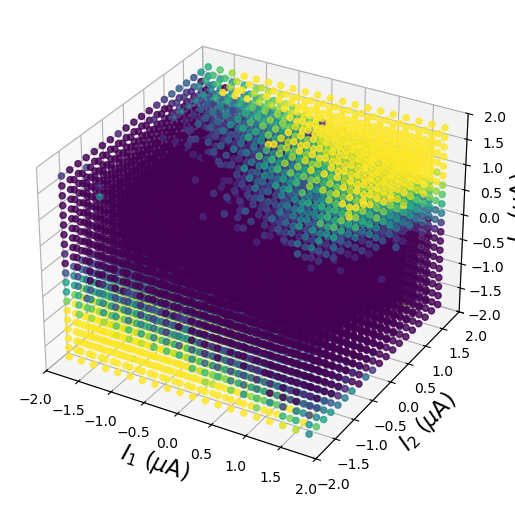

311 219


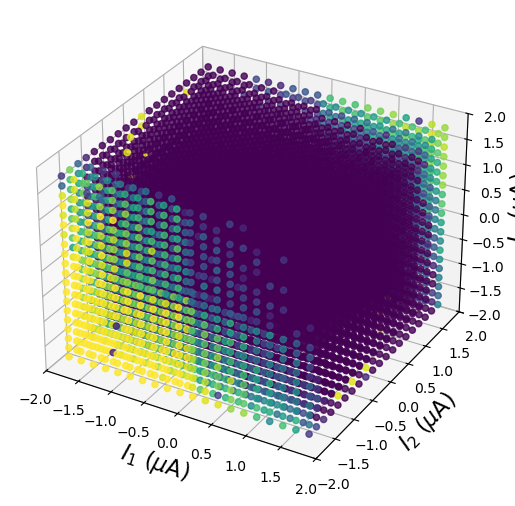

(3, 8000) (3, 8000)
311 0.99


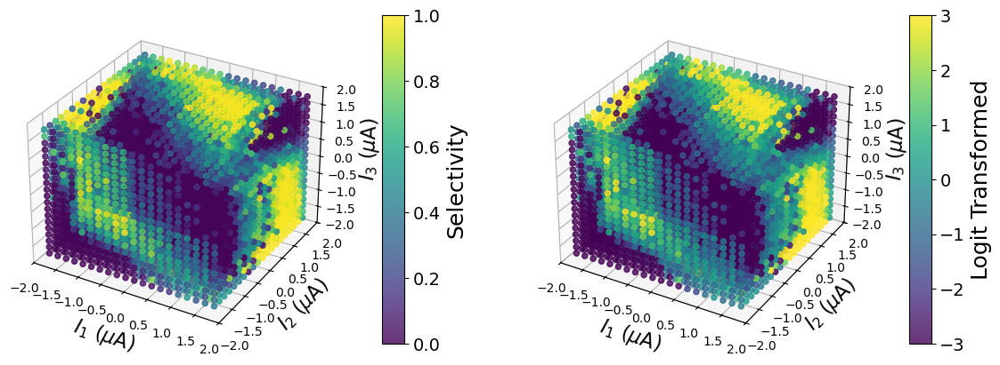

In [5]:
datapath = '/Volumes/Lab/Users/praful/Vasireddy2025/data'
dataset = '2020-09-29-2'
pattern = 311

file_list = os.listdir(datapath)

ms = [1, 2, 3, 4, 5]
zero_prob = 0.01
slope_bound = 100
R2_thresh = 0.025
reg_param = 0.5
method = 'L-BFGS-B'
reg_method = 'l2'

patterns = {}
for file in file_list:
    if file.endswith('.mat') and file.startswith('fit'):
        file_dataset = file.split('.mat')[0].split('_')[-2]
        if file_dataset != dataset:
            continue
        pattern_cell = file.split('.mat')[0].split('_')[-1]
        p, c = pattern_cell.replace('p', '').split('c')
        p = int(p)
        c = int(c)
        print(p, c)
        if p != pattern:
            continue
        
        data = loadmat(os.path.join(datapath, file))
        amps_gsort = data['amps']
        probs_flipped = data['probs'].flatten()
        num_trials = data['trials'].flatten()
        
        spikes_cp = []
        for i in range(len(num_trials)):
            num1s = int(np.around(probs_flipped[i] * num_trials[i], 0))
            num0s = num_trials[i] - num1s

            spikes_amp = np.random.permutation(np.concatenate((np.ones(num1s), np.zeros(num0s)))).astype(int)
            spikes_cp.append(spikes_amp)
        spikes_cp = np.array(spikes_cp, dtype=object)

        # At this point X has all the amps, and probs_fit has all the empirical probabilities

        fig = plt.figure(2)
        fig.clear()
        ax = Axes3D(fig, auto_add_to_figure=False)
        fig.add_axes(ax)
        plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
        plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
        plt.xlim(-2, 2)
        plt.ylim(-2, 2)
        ax.set_zlim(-2, 2)
        ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

        scat = ax.scatter(amps_gsort[:, 0], 
                            amps_gsort[:, 1],
                            amps_gsort[:, 2], marker='o', 
                            c=probs_flipped, s=20, alpha=0.8, vmin=0, vmax=1)
        plt.show()

        if p not in patterns:
            patterns[p] = []
        patterns[p].append((c, probs_flipped, spikes_cp, num_trials))

selectivities = {}
for p in patterns:
    cells = [c for c, _, _, _ in patterns[p]]
    probs_all = np.vstack([probs for _, probs, _, _ in patterns[p]])
    spikes_all = np.array([spikes for _, _, spikes, _ in patterns[p]], dtype=object)
    trials_all = patterns[p][0][-1]
    print(probs_all.shape, spikes_all.shape)

    if len(cells) < 2:
        continue

    selectivity = global_selectivity(probs_all)
    selectivity = np.clip(selectivity, 1e-2, 1-1e-2)

    selectivity_logit = np.log(selectivity/(1-selectivity))
    selectivities[p] = (selectivity, selectivity_logit, probs_all, spikes_all, trials_all)
    print(p, np.amax(selectivity))

    fig = plt.figure(figsize=(14, 6))

    ax1 = fig.add_subplot(121, projection='3d')
    scat1 = ax1.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                        c=selectivity, marker='o', s=20, alpha=0.8, vmin=0, vmax=1)
    ax1.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax1.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax1.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax1.set_xlim(-2, 2)
    ax1.set_ylim(-2, 2)
    ax1.set_zlim(-2, 2)
    cbar1 = fig.colorbar(scat1, ax=ax1, shrink=0.8, aspect=15, pad=0.1)
    cbar1.ax.tick_params(labelsize=14)  # Larger tick labels
    cbar1.set_label('Selectivity', fontsize=18)  # Larger label

    # Panel 2: Subsampled selectivity
    ax2 = fig.add_subplot(122, projection='3d')
    scat2 = ax2.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                        c=selectivity_logit, marker='o', s=20, alpha=0.8, vmin=-3, vmax=3)
    ax2.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax2.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax2.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax2.set_xlim(-2, 2)
    ax2.set_ylim(-2, 2)
    ax2.set_zlim(-2, 2)
    cbar2 = fig.colorbar(scat2, ax=ax2, shrink=0.8, aspect=15, pad=0.1)
    cbar2.ax.tick_params(labelsize=14)  # Larger tick labels
    cbar2.set_label('Logit Transformed', fontsize=18)  # Larger label
    plt.show()

In [6]:
for p in patterns:
    spikes_all = selectivities[p][3]
    probs_all = selectivities[p][2]

    for i in range(len(spikes_all)):
        for j in range(len(spikes_all[i])):
            assert np.around(np.mean(spikes_all[i][j]), 3) == np.around(probs_all[i][j], 3), f"Mismatch between spikes and true probabilities at ({i}, {j})"

In [7]:
patterns

{311: [(218,
   array([0., 0., 0., ..., 1., 1., 1.]),
   array([array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
          array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
          array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
          ...,
          array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
          array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
          array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])],
         dtype=object),
   array([20, 20, 20, ..., 20, 19, 19])),
  (222,
   array([0., 0., 0., ..., 1., 1., 1.]),
   array([array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
          array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
          array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
          ...,
          array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
          array(

Iteration 1/10000 - Training Loss: 7.360239028930664
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 6.875091075897217
  Lengthscale: tensor([[0.6398]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7494], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 6.443821430206299
  Lengthscale: tensor([[0.5947]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8016], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 6.071877956390381
  Lengthscale: tensor([[0.5532]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8536], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.755102157592773
  Lengthscale: tensor([[0.5156]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9046], device='cuda:0', grad_fn=<AddBackward

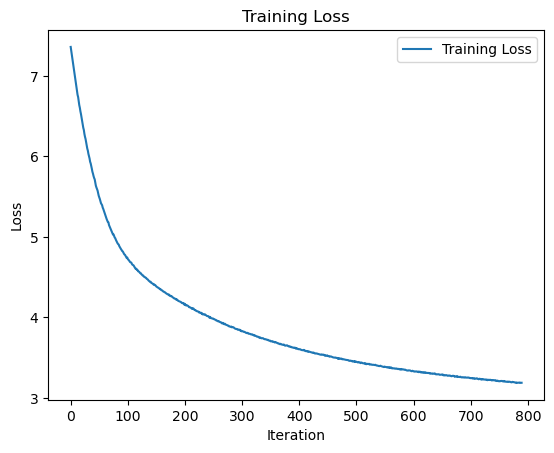

Iteration 1/10000 - Training Loss: 7.358654499053955
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 6.87321662902832
  Lengthscale: tensor([[0.6398]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7494], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 6.445288181304932
  Lengthscale: tensor([[0.5947]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8016], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 6.065125942230225
  Lengthscale: tensor([[0.5532]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8536], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.764601230621338
  Lengthscale: tensor([[0.5156]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9046], device='cuda:0', grad_fn=<AddBackward0

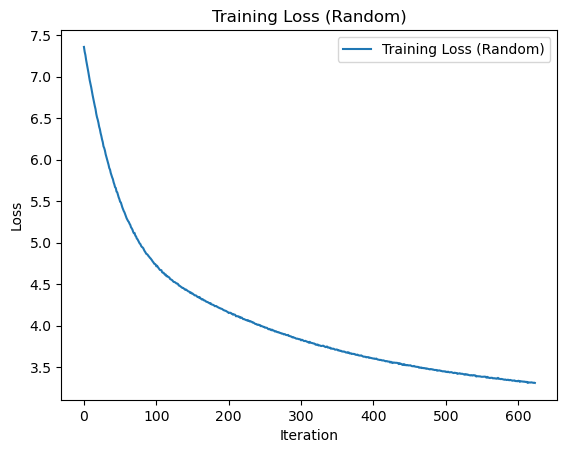

Number of sites: 1, Test R2: -0.5545572630152911
Number of sites: 2, Test R2: 0.24532200312527408
Number of sites: 3, Test R2: 0.16196227593481705
Number of sites: 1, Test R2: -0.9664559278518321
Number of sites: 2, Test R2: 0.30348150984824374
Number of sites: 3, Test R2: 0.22663838947986348
Number of sites: 1, Test R2: -0.0642731974551427
Number of sites: 2, Test R2: 0.12605031030418867
Number of sites: 3, Test R2: -0.01697317735413617


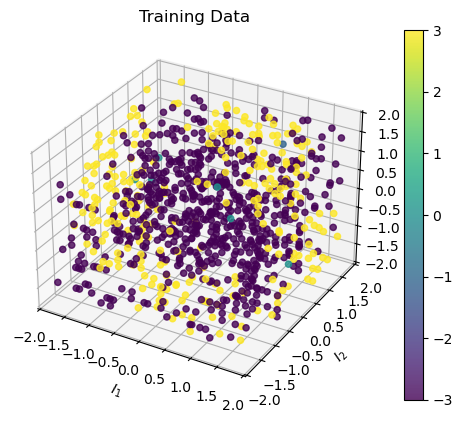

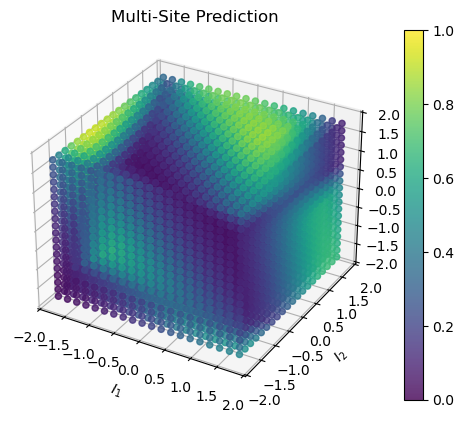

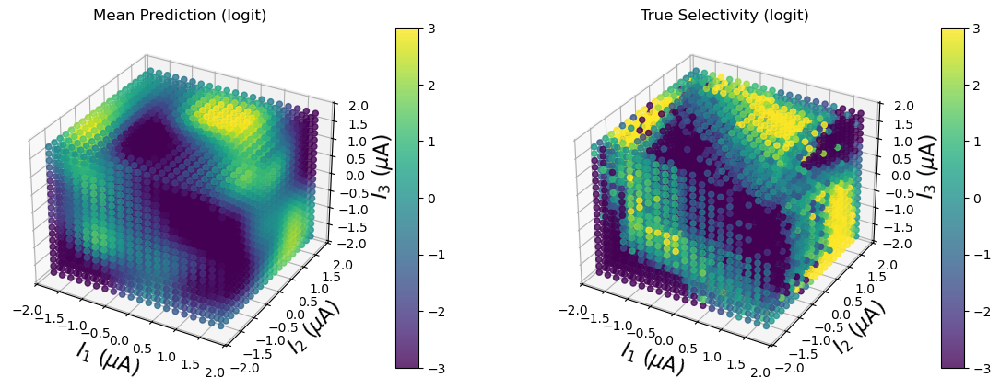

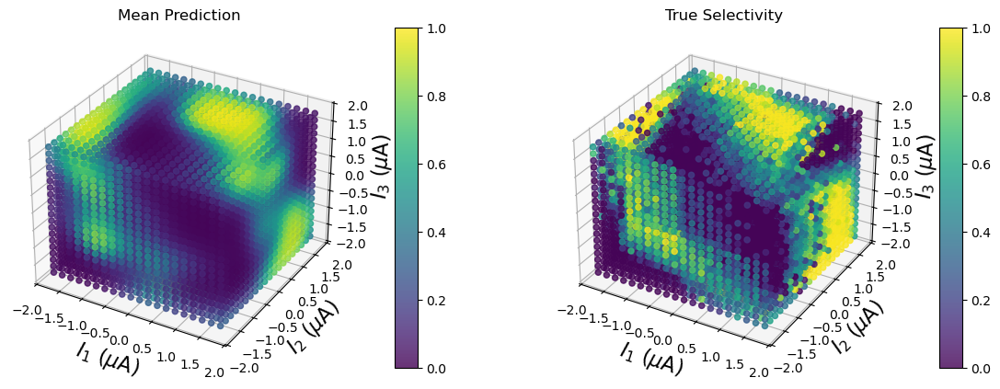

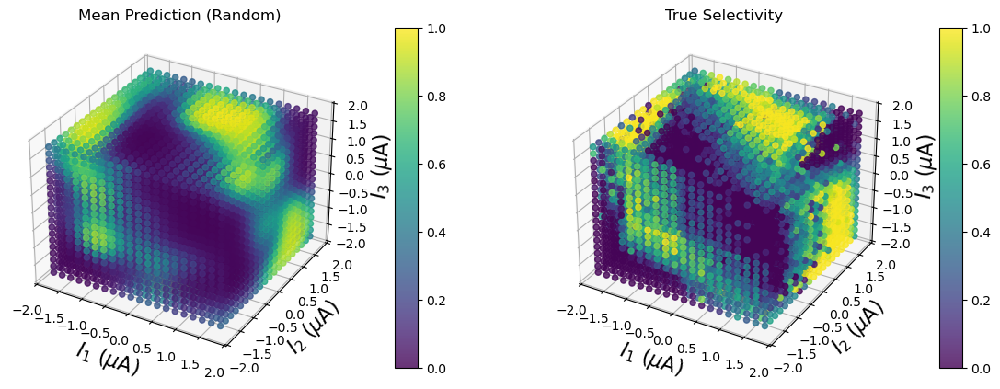

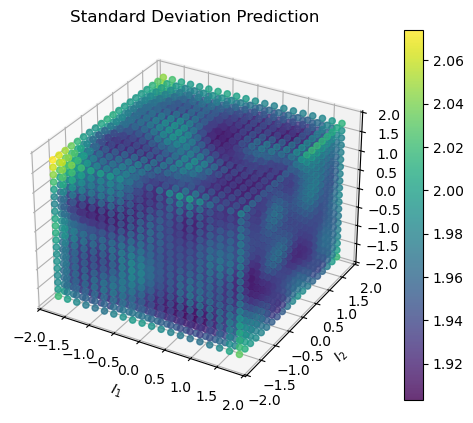

RMSE: 0.27558979205144424, RMSE (Random): 0.26555941206602457, RMSE (Multisite): 0.30362211179016635
MAE: 0.19827671927428736, MAE (Random): 0.186953081480541, MAE (Multisite): 0.2803936844920316
RMSE (logit): 3.117695651103338, RMSE (Random, logit): 3.027252737962911, RMSE (Multisite, logit): 3.679156130068912
MAE (logit): 2.8516174090746658, MAE (Random, logit): 2.7438273674426634, MAE (Multisite, logit): 3.6296873518500274


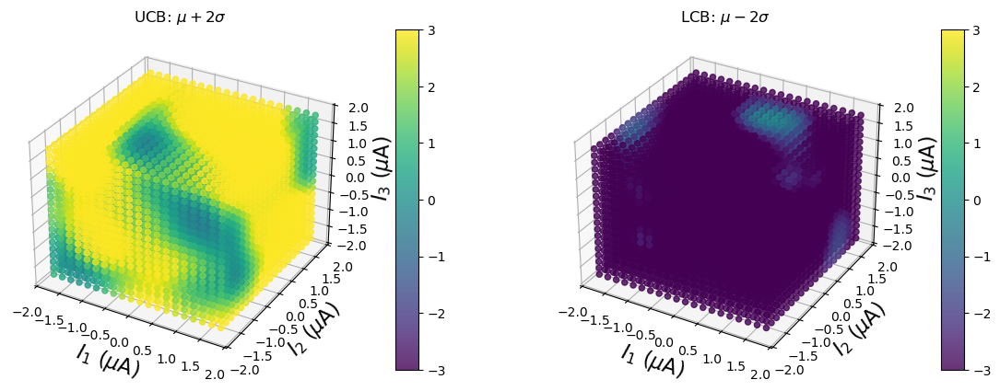

Iteration 1/10000 - Training Loss: 8.777812004089355
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 8.192061424255371
  Lengthscale: tensor([[0.6398]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 7.679701805114746
  Lengthscale: tensor([[0.5946]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 7.221060752868652
  Lengthscale: tensor([[0.5527]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8543], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 6.831791877746582
  Lengthscale: tensor([[0.5141]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9061], device='cuda:0', grad_fn=<AddBackward

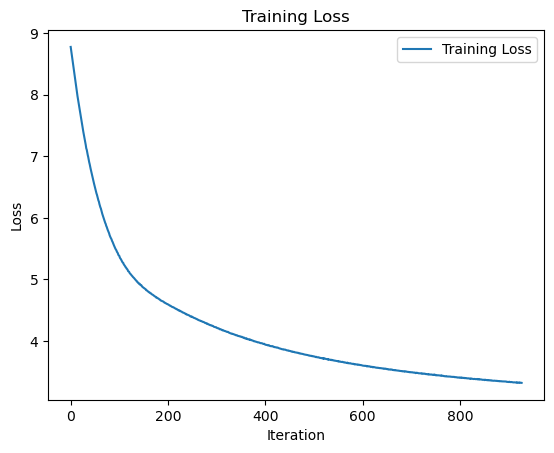

Iteration 1/10000 - Training Loss: 6.7085185050964355
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 6.274644374847412
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7494], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 5.897268295288086
  Lengthscale: tensor([[0.5949]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8017], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 5.569770336151123
  Lengthscale: tensor([[0.5538]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8539], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.28766393661499
  Lengthscale: tensor([[0.5167]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9053], device='cuda:0', grad_fn=<AddBackward

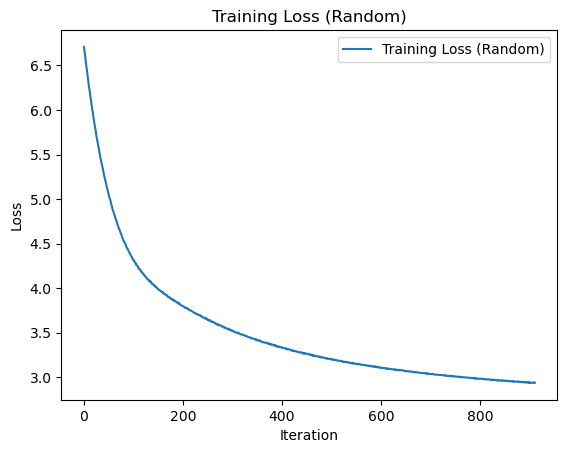

Number of sites: 1, Test R2: -0.866342453706654
Number of sites: 2, Test R2: 0.3627124494762085
Number of sites: 3, Test R2: 0.3039981711747165
Number of sites: 1, Test R2: -0.885005522160351
Number of sites: 2, Test R2: 0.4661157009393776
Number of sites: 3, Test R2: 0.42446132144728765
Number of sites: 1, Test R2: -0.11064949062387641
Number of sites: 2, Test R2: 0.2962474250640048
Number of sites: 3, Test R2: 0.21359865202239448


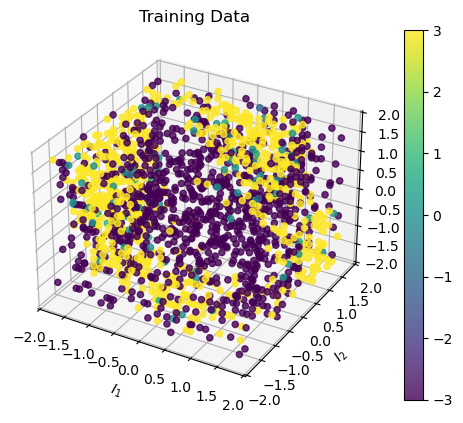

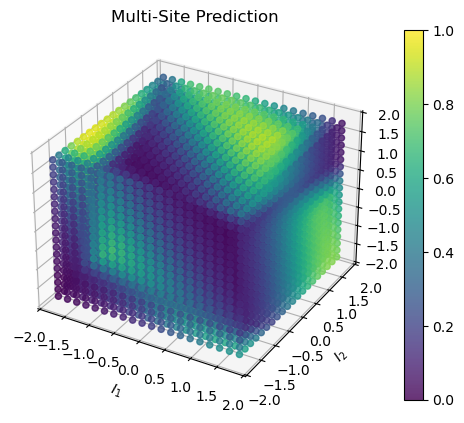

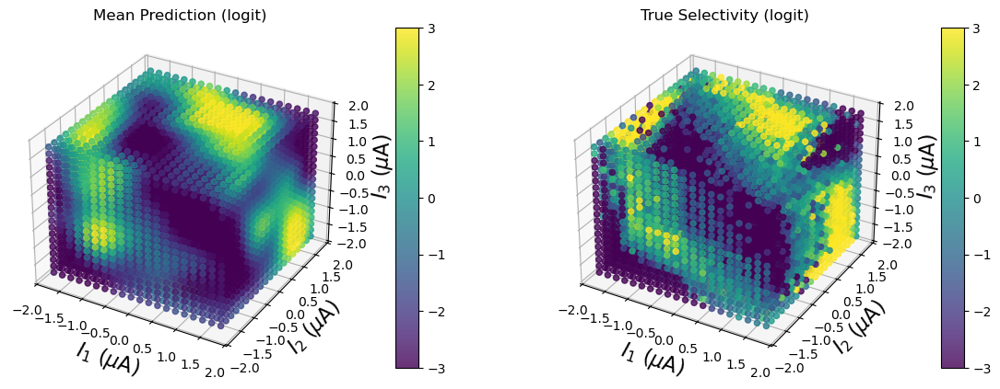

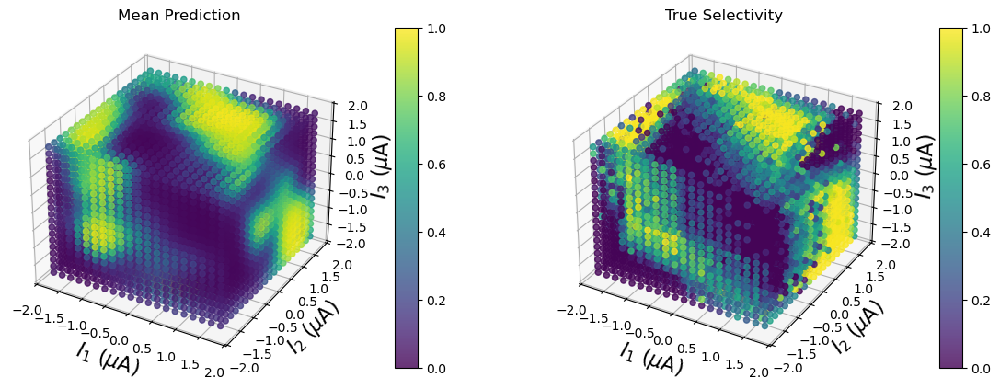

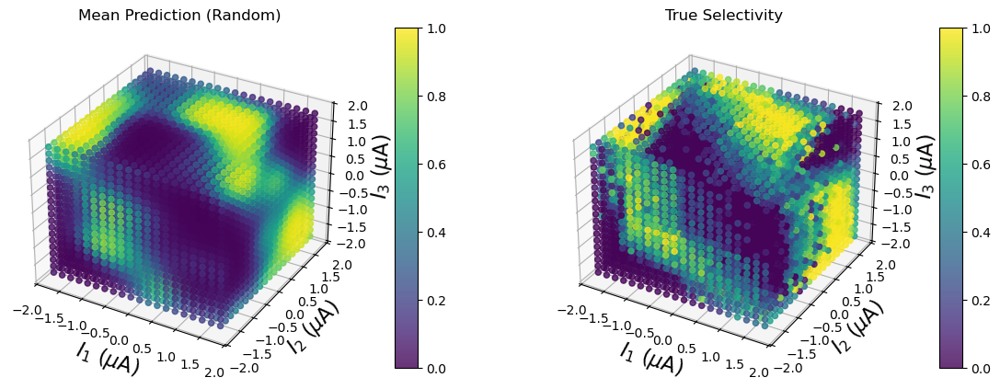

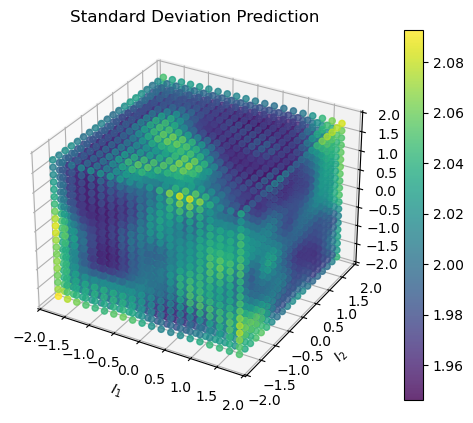

RMSE: 0.18495005060441005, RMSE (Random): 0.23796404635311735, RMSE (Multisite): 0.24078805282191695
MAE: 0.117296187219936, MAE (Random): 0.1464422456697282, MAE (Multisite): 0.21461048016224907
RMSE (logit): 2.4472833613222007, RMSE (Random, logit): 2.6624198072520193, RMSE (Multisite, logit): 3.3070129510274007
MAE (logit): 2.153658820184813, MAE (Random, logit): 2.274453618643232, MAE (Multisite, logit): 3.2349978596467976


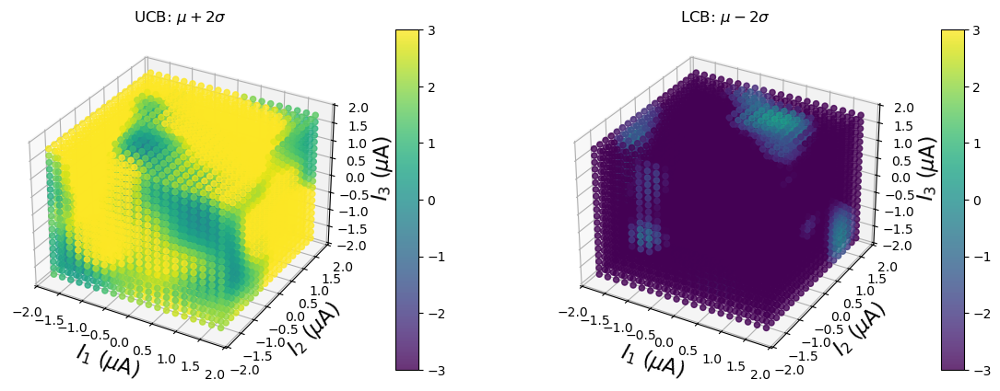

Iteration 1/10000 - Training Loss: 8.503843307495117
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 7.940216541290283
  Lengthscale: tensor([[0.6398]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 7.44651460647583
  Lengthscale: tensor([[0.5947]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 7.014243125915527
  Lengthscale: tensor([[0.5531]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8544], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 6.641128063201904
  Lengthscale: tensor([[0.5151]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9063], device='cuda:0', grad_fn=<AddBackward0

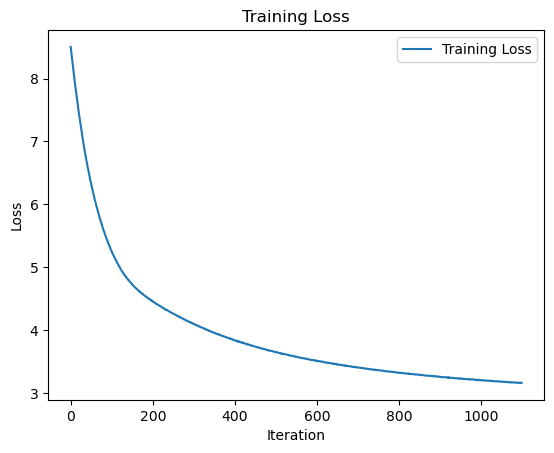

Iteration 1/10000 - Training Loss: 6.707214832305908
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 6.270787239074707
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7494], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 5.88596248626709
  Lengthscale: tensor([[0.5950]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8017], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 5.558982849121094
  Lengthscale: tensor([[0.5540]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8541], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.278319835662842
  Lengthscale: tensor([[0.5170]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9057], device='cuda:0', grad_fn=<AddBackward0

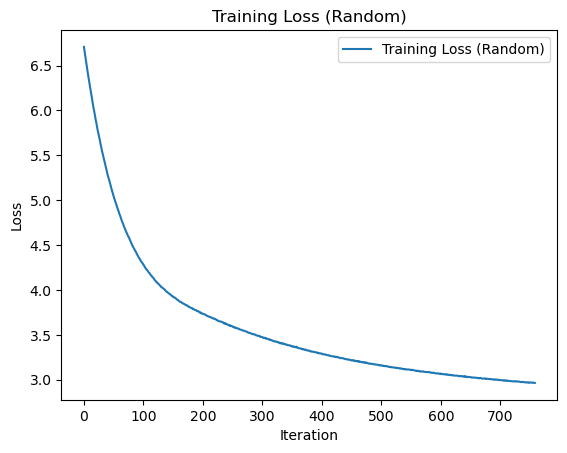

Number of sites: 1, Test R2: -0.512224383645635
Number of sites: 2, Test R2: 0.43204523387737626
Number of sites: 3, Test R2: 0.389847765164696
Number of sites: 1, Test R2: -1.1333815559235338
Number of sites: 2, Test R2: 0.4809589686423146
Number of sites: 3, Test R2: 0.4506259798751109
Number of sites: 1, Test R2: -0.2517877537238318
Number of sites: 2, Test R2: 0.3643456221708844
Number of sites: 3, Test R2: 0.2789331054634976


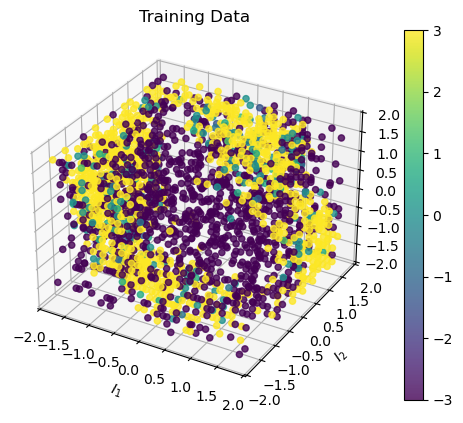

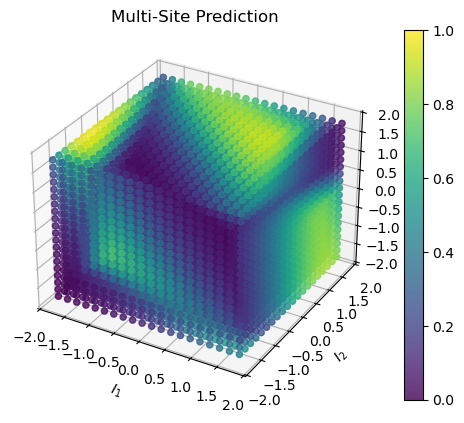

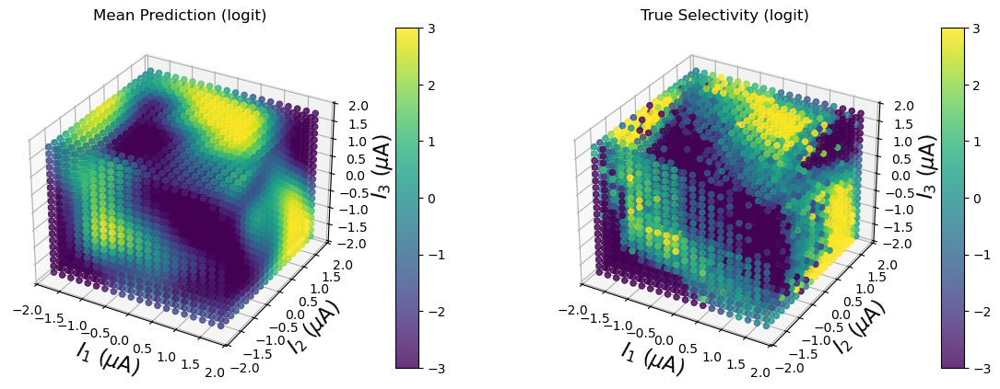

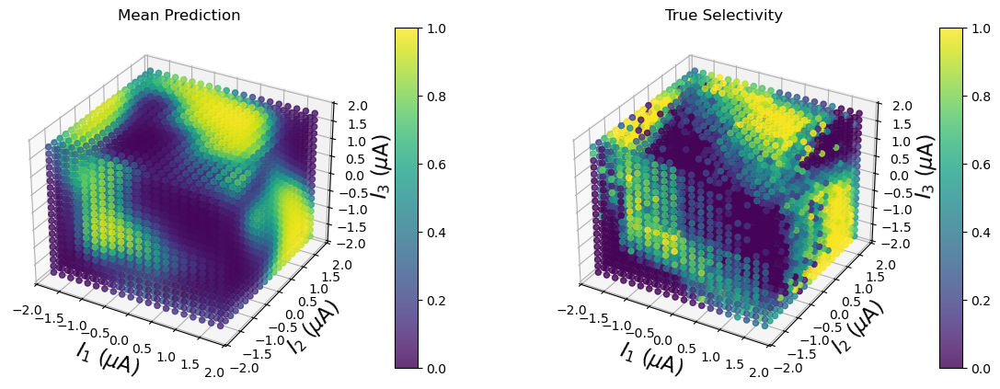

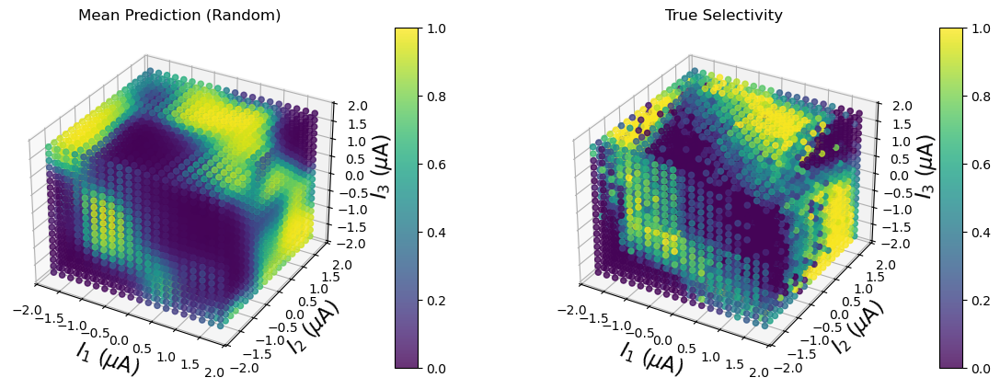

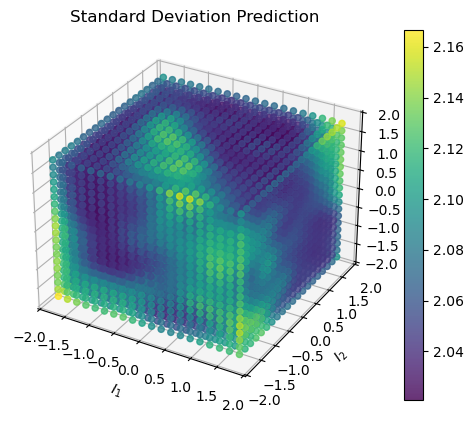

RMSE: 0.16002067516943838, RMSE (Random): 0.1946924213021875, RMSE (Multisite): 0.22031633110104176
MAE: 0.08869752016791416, MAE (Random): 0.11394587825516223, MAE (Multisite): 0.18887554330261766
RMSE (logit): 2.1462400020037875, RMSE (Random, logit): 2.3383464616634977, RMSE (Multisite, logit): 3.123446494606033
MAE (logit): 1.8192868412956746, MAE (Random, logit): 1.9631788857400239, MAE (Multisite, logit): 3.0368188961291436


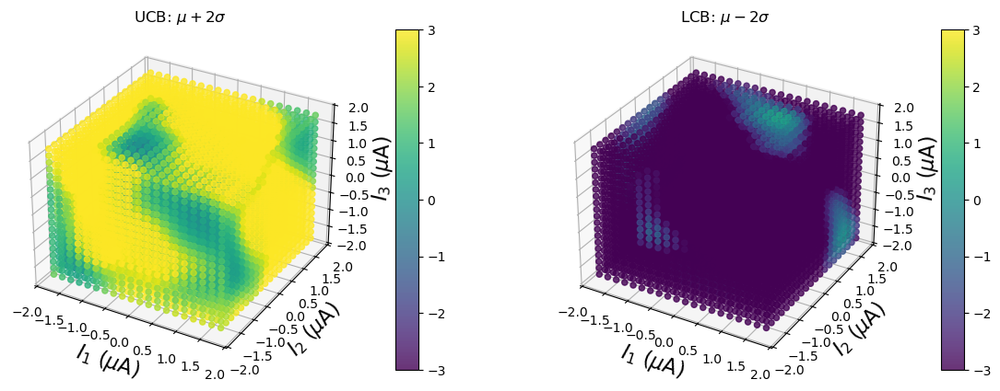

Iteration 1/10000 - Training Loss: 8.202478408813477
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 7.66410493850708
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 7.1867146492004395
  Lengthscale: tensor([[0.5949]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 6.772510051727295
  Lengthscale: tensor([[0.5535]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8544], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 6.415213584899902
  Lengthscale: tensor([[0.5156]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9064], device='cuda:0', grad_fn=<AddBackward

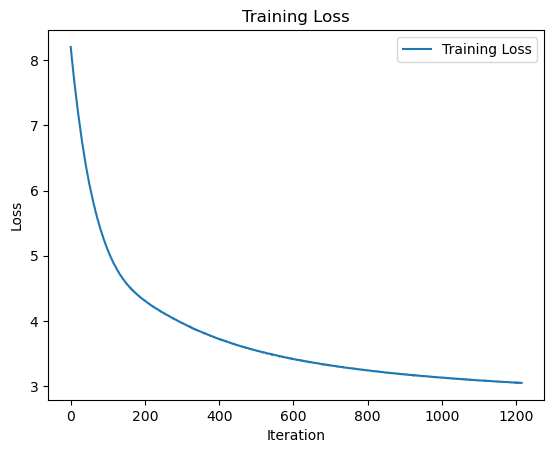

Iteration 1/10000 - Training Loss: 6.5942230224609375
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 6.1707444190979
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 5.80277156829834
  Lengthscale: tensor([[0.5949]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 5.483492374420166
  Lengthscale: tensor([[0.5537]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8542], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.208937644958496
  Lengthscale: tensor([[0.5162]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9060], device='cuda:0', grad_fn=<AddBackward0>

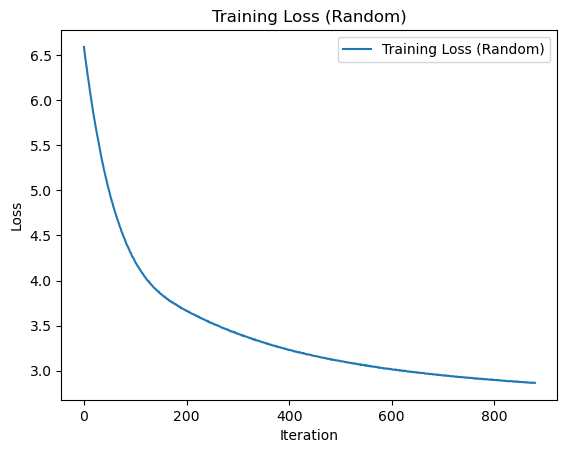

Number of sites: 1, Test R2: -0.7578149646142782
Number of sites: 2, Test R2: 0.5064138605196954
Number of sites: 3, Test R2: 0.4759029653974014
Number of sites: 1, Test R2: -0.8200041435679775
Number of sites: 2, Test R2: 0.4762692803728965
Number of sites: 3, Test R2: 0.44706784167311275
Number of sites: 1, Test R2: 0.025388422260495314
Number of sites: 2, Test R2: 0.36574249303301143
Number of sites: 3, Test R2: 0.29712320477422816


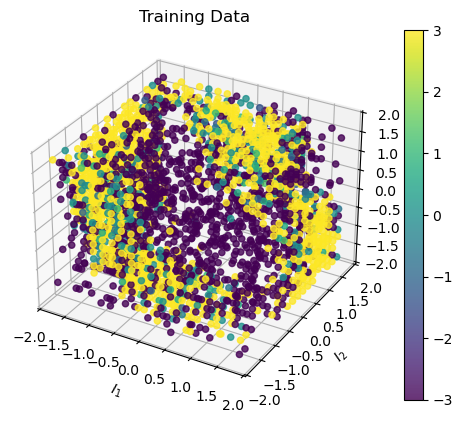

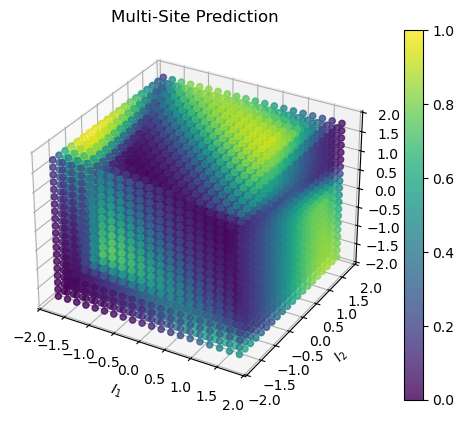

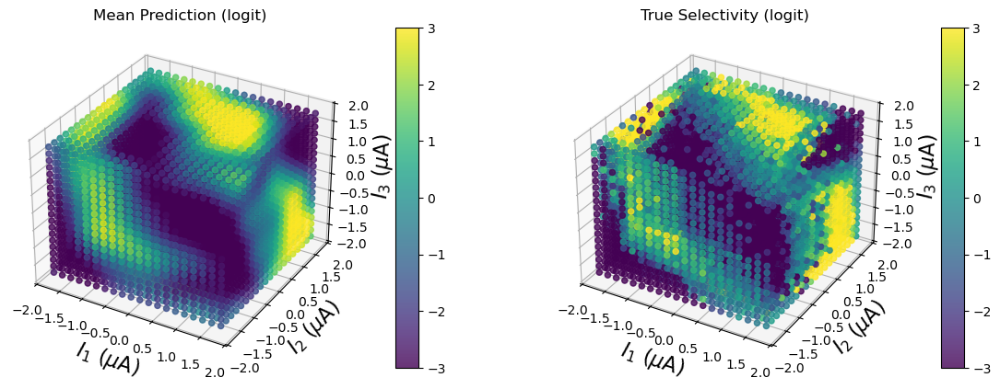

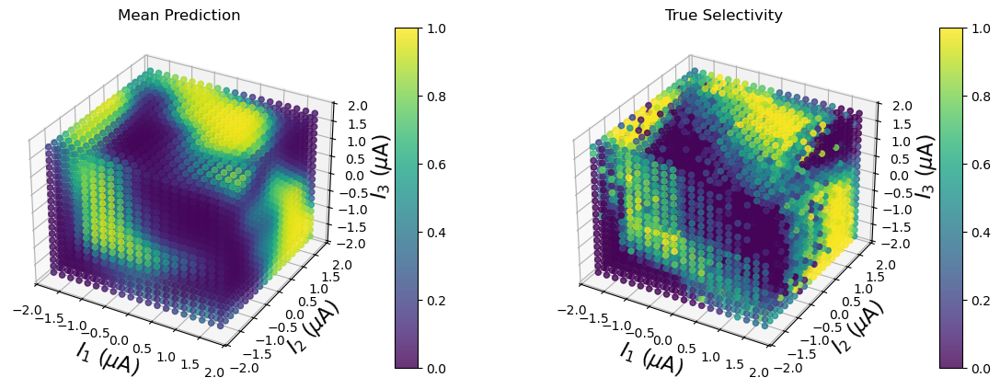

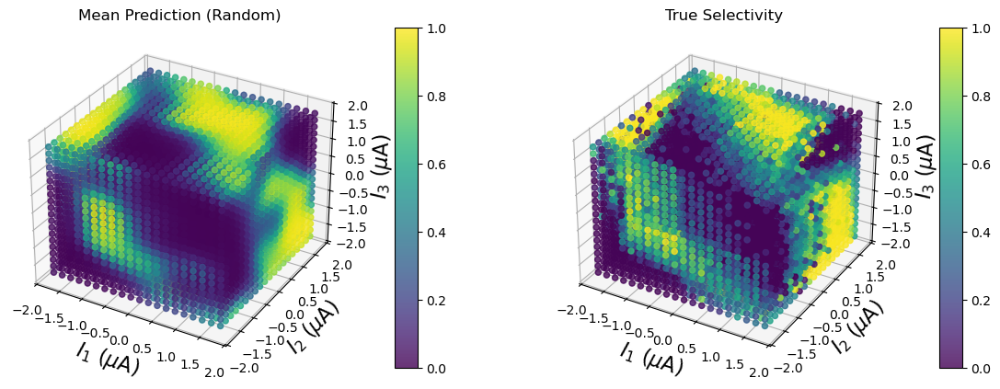

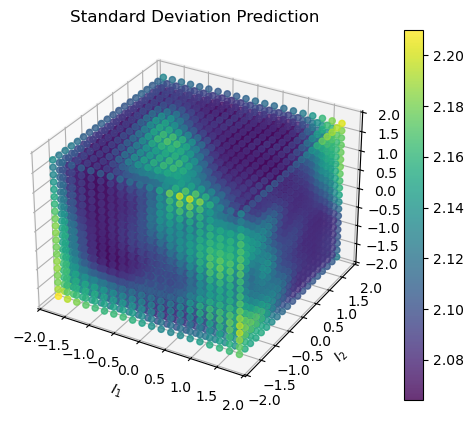

RMSE: 0.1536717594735856, RMSE (Random): 0.17937342787416716, RMSE (Multisite): 0.20689230738721578
MAE: 0.08449707903150244, MAE (Random): 0.10067377921401693, MAE (Multisite): 0.17223249435407317
RMSE (logit): 2.0825531077441584, RMSE (Random, logit): 2.2226566999331197, RMSE (Multisite, logit): 3.0014150011673824
MAE (logit): 1.7461693826189082, MAE (Random, logit): 1.8545090275912617, MAE (Multisite, logit): 2.8898389164973732


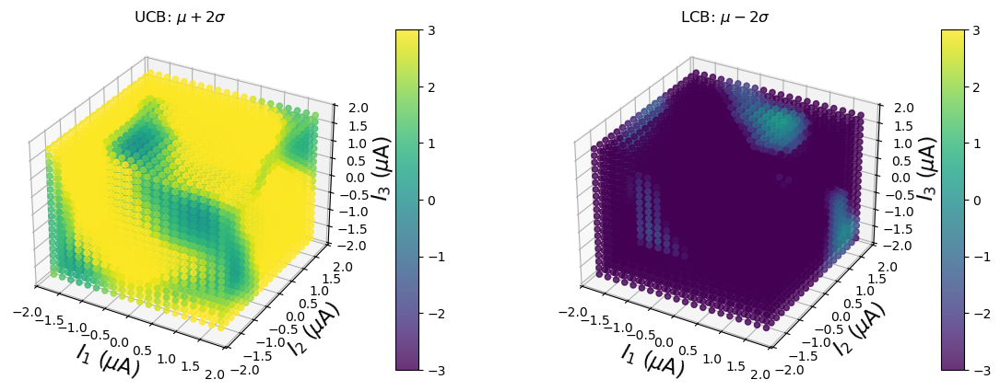

Iteration 1/10000 - Training Loss: 7.619405269622803
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 7.120153427124023
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 6.684852600097656
  Lengthscale: tensor([[0.5951]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 6.307697772979736
  Lengthscale: tensor([[0.5539]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8544], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.974255084991455
  Lengthscale: tensor([[0.5166]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9063], device='cuda:0', grad_fn=<AddBackward

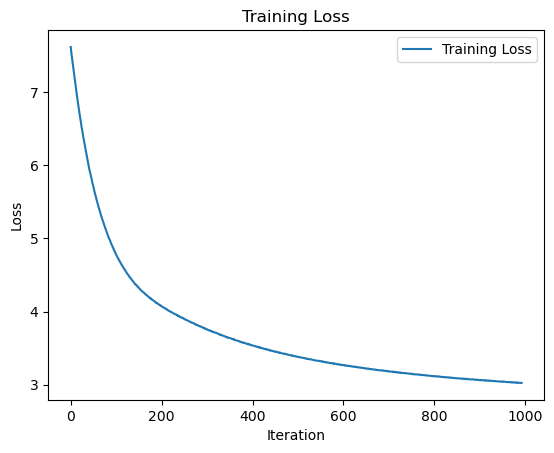

Iteration 1/10000 - Training Loss: 6.3873467445373535
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 5.981330394744873
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 5.629755973815918
  Lengthscale: tensor([[0.5950]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 5.324967861175537
  Lengthscale: tensor([[0.5539]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8542], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.0615315437316895
  Lengthscale: tensor([[0.5166]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9060], device='cuda:0', grad_fn=<AddBackwa

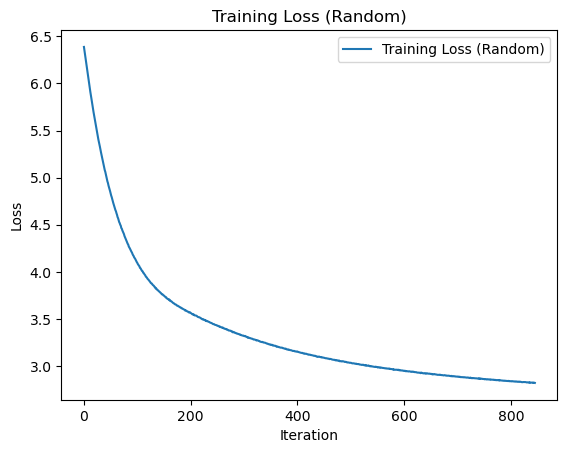

Number of sites: 1, Test R2: -0.3676273434093702
Number of sites: 2, Test R2: 0.5200764589188975
Number of sites: 3, Test R2: 0.4884798744895711
Number of sites: 1, Test R2: -1.0281200590353312
Number of sites: 2, Test R2: 0.5503325501341023
Number of sites: 3, Test R2: 0.5273503671737173
Number of sites: 1, Test R2: 0.07563188495483386
Number of sites: 2, Test R2: 0.48226679904830594
Number of sites: 3, Test R2: 0.4374609678753666


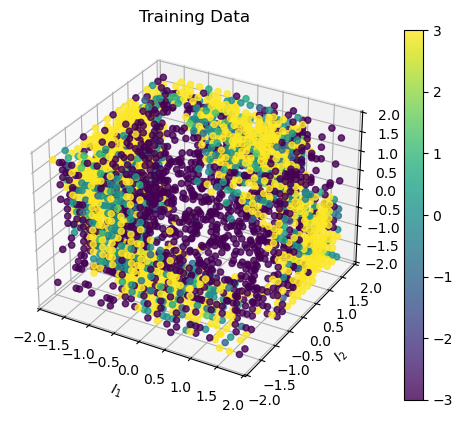

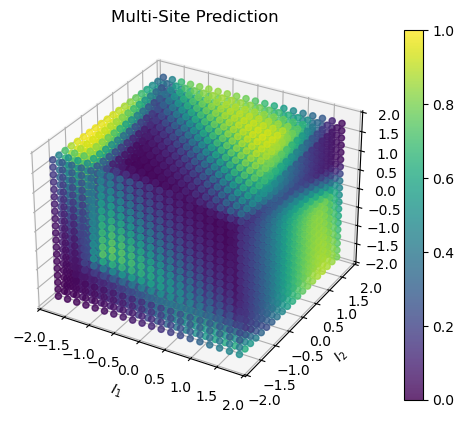

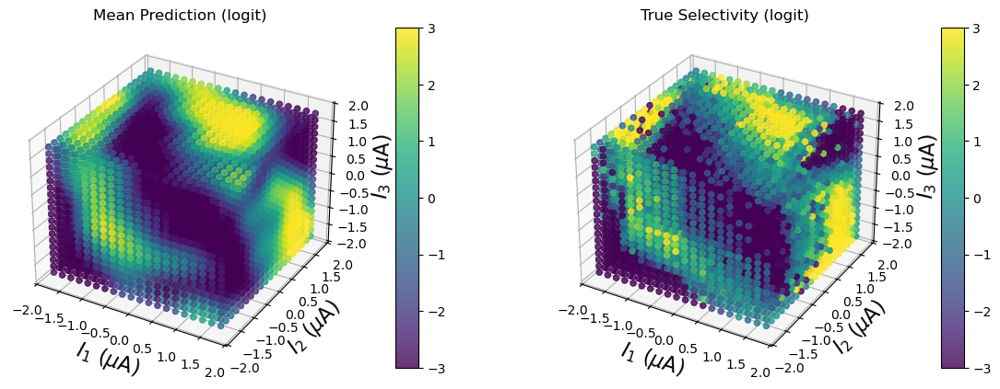

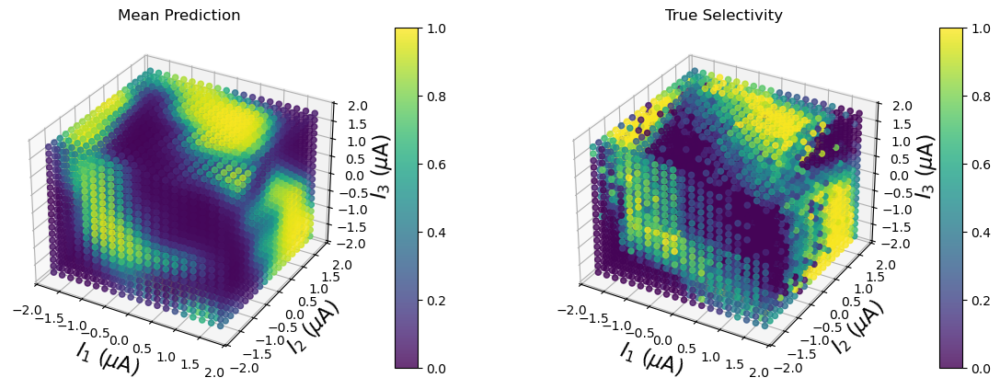

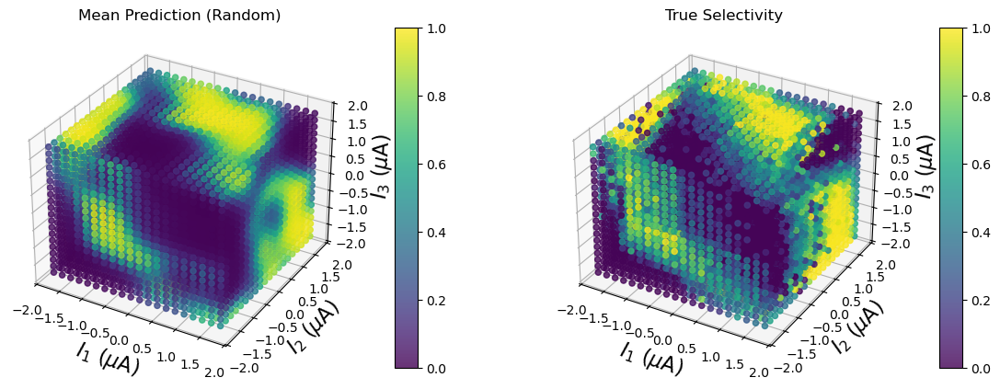

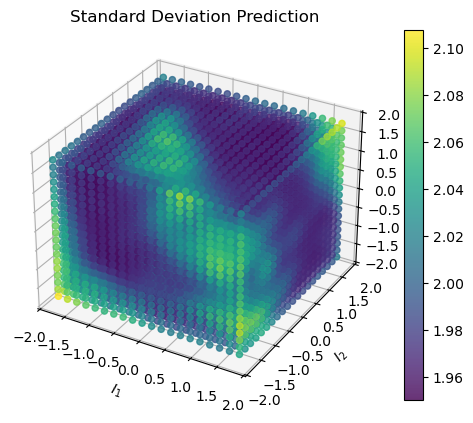

RMSE: 0.14646252039370744, RMSE (Random): 0.17274866246831774, RMSE (Multisite): 0.19627829201093341
MAE: 0.0764839821835612, MAE (Random): 0.0952125118869001, MAE (Multisite): 0.16045432437632126
RMSE (logit): 1.9566774434286807, RMSE (Random, logit): 2.1350679495301623, RMSE (Multisite, logit): 2.9165340174018017
MAE (logit): 1.600687859734395, MAE (Random, logit): 1.7787255082431948, MAE (Multisite, logit): 2.7953664088897225


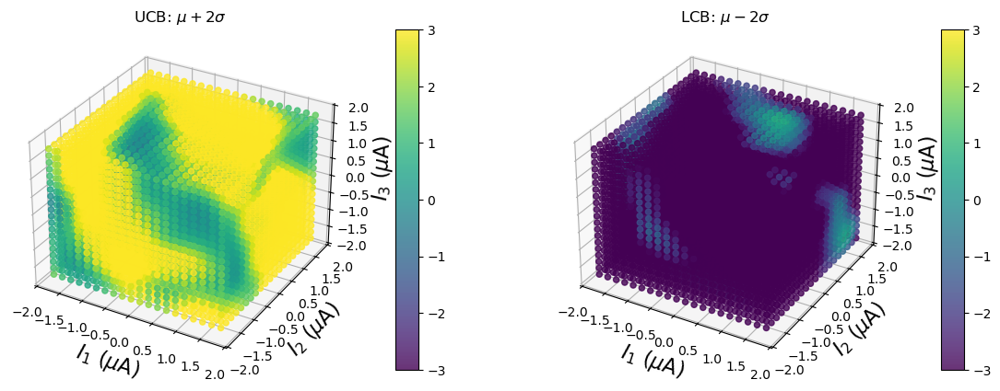

Iteration 1/10000 - Training Loss: 7.169577598571777
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 6.702744007110596
  Lengthscale: tensor([[0.6400]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 6.292905330657959
  Lengthscale: tensor([[0.5953]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 5.945504188537598
  Lengthscale: tensor([[0.5546]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8543], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.642673969268799
  Lengthscale: tensor([[0.5178]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9063], device='cuda:0', grad_fn=<AddBackward

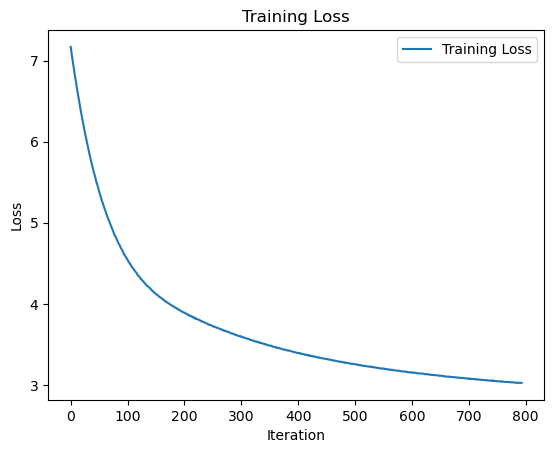

Iteration 1/10000 - Training Loss: 6.173146724700928
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 5.786619186401367
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 5.449797630310059
  Lengthscale: tensor([[0.5951]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 5.152317047119141
  Lengthscale: tensor([[0.5543]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8543], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 4.905473709106445
  Lengthscale: tensor([[0.5175]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9061], device='cuda:0', grad_fn=<AddBackward

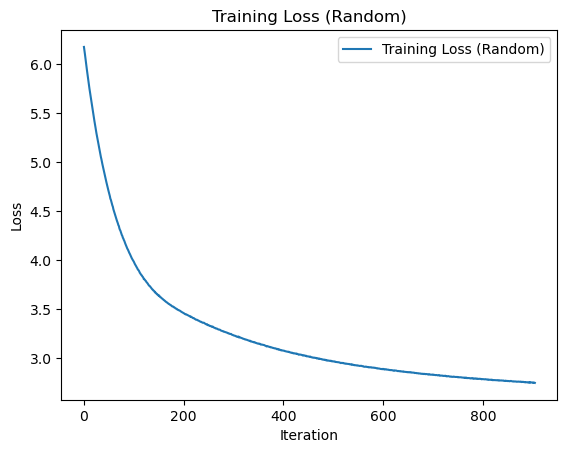

Number of sites: 1, Test R2: -0.7155281135226648
Number of sites: 2, Test R2: 0.5383941920053039
Number of sites: 3, Test R2: 0.5137529855335531
Number of sites: 1, Test R2: -0.8502194985430822
Number of sites: 2, Test R2: 0.5479747154024297
Number of sites: 3, Test R2: 0.5281758249167959
Number of sites: 1, Test R2: -0.0034635727733811628
Number of sites: 2, Test R2: 0.4460843968493896
Number of sites: 3, Test R2: 0.38847654603778103


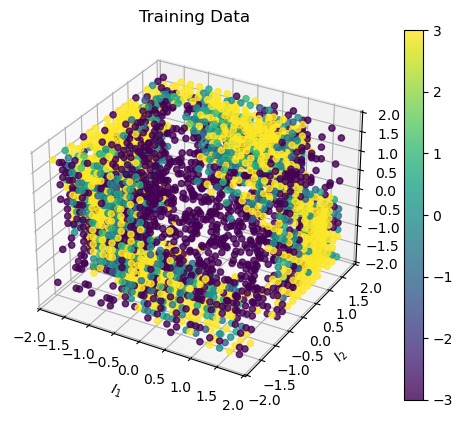

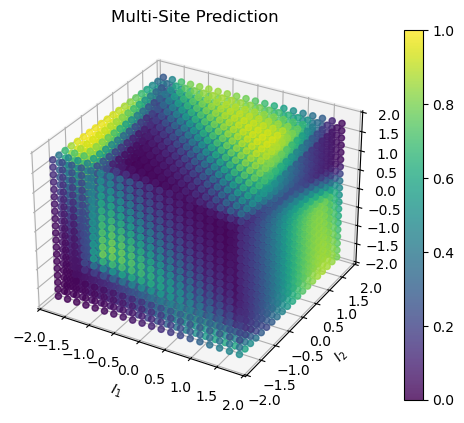

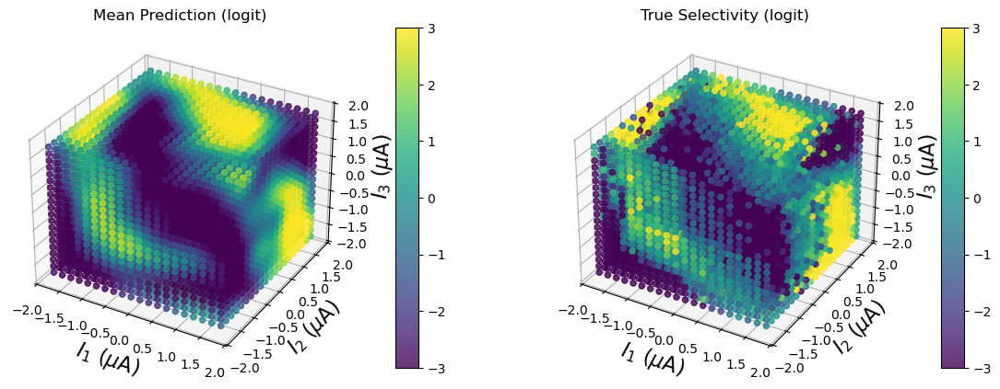

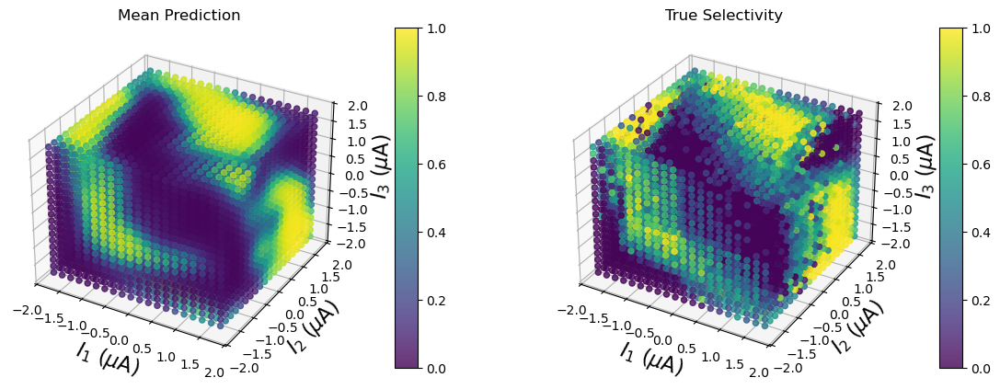

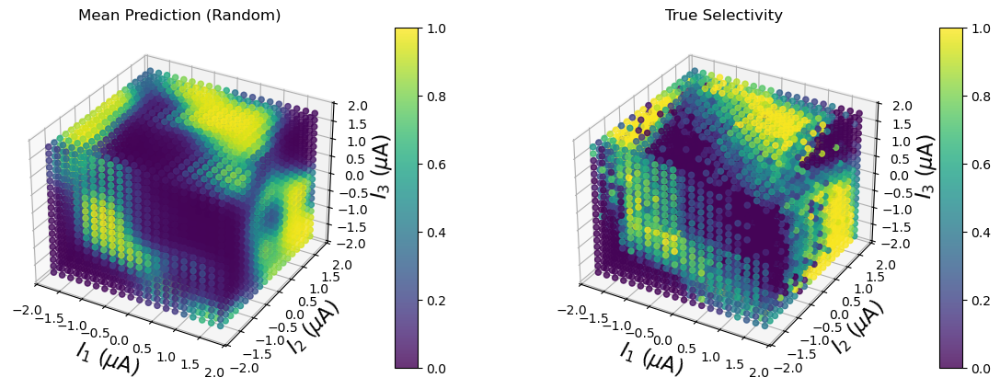

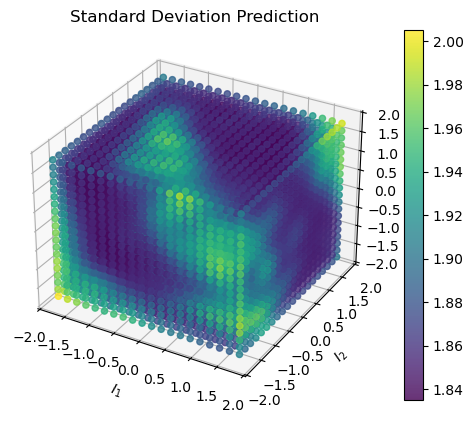

RMSE: 0.1462993037421929, RMSE (Random): 0.16470731583137724, RMSE (Multisite): 0.19553587495604816
MAE: 0.07303913656188937, MAE (Random): 0.09036283486650652, MAE (Multisite): 0.15837632610402608
RMSE (logit): 1.8801886425523733, RMSE (Random, logit): 2.1048975072599205, RMSE (Multisite, logit): 2.896436539717272
MAE (logit): 1.513927009592597, MAE (Random, logit): 1.7604189225303182, MAE (Multisite, logit): 2.765104764926499


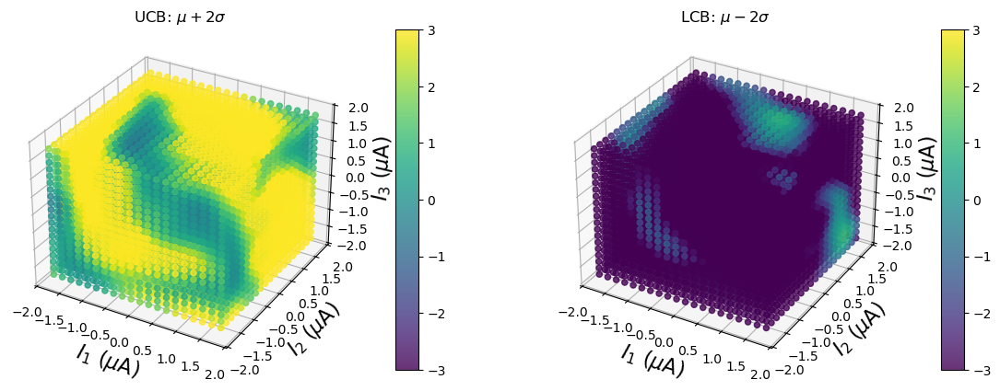

In [8]:
beta = 2
lcb_cutoff = 3    # ln(0.8/0.2) = 1.5, ln(0.9/0.1) = 2.2, ln(0.95/0.05) = 3
batch_size = 1000
num_steps = 6
init_trials = 1000

# Step 0: Initialize the data
init_inds = np.random.choice(np.arange(len(amps_gsort), dtype=int), init_trials, replace=True)

# Count occurrences of each index
T_prev = np.bincount(init_inds, minlength=len(amps_gsort))
T_prev_random = deepcopy(T_prev)
max_trials = selectivities[pattern][4]

subsample_inds = np.where(T_prev > 0)[0]
probs = sample_spikes_array(selectivities[pattern][3], T_prev)
selec_probs = global_selectivity(probs[:, subsample_inds])

subsample_inds_random = deepcopy(subsample_inds)
selec_probs_random = deepcopy(selec_probs)

num_samples = []
num_samples_random = []

success_fractions = []
success_fractions_random = []

RMSEs = []
RMSEs_logit = []
MAEs = []
MAEs_logit = []

RMSEs_random = []
RMSEs_random_logit = []
MAEs_random = []
MAEs_random_logit = []

RMSEs_multisite = []
RMSEs_multisite_logit = []
MAEs_multisite = []
MAEs_multisite_logit = []
for step in range(num_steps):
    # Step 1: fitting the GP model

    Xdata = amps_gsort[subsample_inds]
    selec_probs = np.clip(selec_probs, 1e-2, 1-1e-2)
    y = np.log(selec_probs/(1-selec_probs))

    Xdata_random = amps_gsort[subsample_inds_random]
    selec_probs_random = np.clip(selec_probs_random, 1e-2, 1-1e-2)
    y_random = np.log(selec_probs_random/(1-selec_probs_random))

    # Assuming Xdata and y are in numpy format, convert them to torch tensors
    amps_plot_torch = torch.tensor(amps_gsort, dtype=torch.float32)
    X_train = torch.tensor(Xdata, dtype=torch.float32)
    y_train = torch.tensor(y.reshape(-1), dtype=torch.float32)
    X_train_random = torch.tensor(Xdata_random, dtype=torch.float32)
    y_train_random = torch.tensor(y_random.reshape(-1), dtype=torch.float32)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    amps_plot_torch = amps_plot_torch.to(device)
    X_train = X_train.to(device)
    y_train = y_train.to(device)
    X_train_random = X_train_random.to(device)
    y_train_random = y_train_random.to(device)

    # Define the GP Model
    class GPRegressionModel(gpytorch.models.ExactGP):
        def __init__(self, train_x, train_y, likelihood):
            super(GPRegressionModel, self).__init__(train_x, train_y, likelihood)
            self.mean_constant = ConstantMean()
            # self.mean_linear = LinearMean(input_size=train_x.size(1))
            self.covar_module = RBFKernel()

        def forward(self, x):
            # Add the constant and linear mean components manually
            mean_x = self.mean_constant(x)# + self.mean_linear(x)
            covar_x = self.covar_module(x)
            return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

    # Early stopping class
    class EarlyStopping:
        def __init__(self, patience=10, min_delta=0.0):
            """
            :param patience: How many epochs to wait before stopping when loss isn't decreasing.
            :param min_delta: Minimum change in monitored loss to qualify as an improvement.
            """
            self.patience = patience
            self.min_delta = min_delta
            self.counter = 0
            self.best_loss = None
            self.stop = False

        def step(self, val_loss):
            if self.best_loss is None:
                self.best_loss = val_loss
            elif val_loss > self.best_loss - self.min_delta:
                self.counter += 1
                if self.counter >= self.patience:
                    self.stop = True
            else:
                self.best_loss = val_loss
                self.counter = 0

    # Initialize the likelihood and model
    likelihood = GaussianLikelihood()
    model = GPRegressionModel(X_train, y_train, likelihood)

    model = model.to(device)
    likelihood = likelihood.to(device)

    # Set model and likelihood in training mode
    model.train()
    likelihood.train()

    # Use an optimizer
    optimizer = torch.optim.AdamW([{'params': model.parameters()}], lr=1e-2)

    # Set up marginal log likelihood for GPyTorch
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

    # Early stopping setup
    early_stopping = EarlyStopping(patience=10, min_delta=1e-3)

    # Training loop with early stopping
    training_iter = 10000
    losses_train = []
    for i in range(training_iter):
        model.train()
        likelihood.train()
        optimizer.zero_grad()
        output_train = model(X_train)

        loss_train = -mll(output_train, y_train)

        losses_train.append(loss_train.item())
        loss_train.backward()
        optimizer.step()
        early_stopping.step(loss_train.item())

        if early_stopping.stop:
            print(f"Early stopping triggered at iteration {i + 1}")
            break

        if i % 10 == 0:
            print(f"Iteration {i + 1}/{training_iter} - Training Loss: {loss_train.item()}")
            print(f"  Lengthscale: {model.covar_module.lengthscale}")
            print(f"  Noise: {model.likelihood.noise_covar.noise}")
    
    plt.figure()
    plt.plot(losses_train, label='Training Loss')
    plt.legend()
    plt.xlabel('Iteration')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.show()

    # Initialize the likelihood and model
    likelihood_random = GaussianLikelihood()
    model_random = GPRegressionModel(X_train_random, y_train_random, likelihood_random)

    model_random = model_random.to(device)
    likelihood_random = likelihood_random.to(device)

    # Set model and likelihood in training mode
    model_random.train()
    likelihood_random.train()

    # Use an optimizer
    optimizer_random = torch.optim.AdamW([{'params': model_random.parameters()}], lr=1e-2)

    # Set up marginal log likelihood for GPyTorch
    mll_random = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood_random, model_random)

    # Early stopping setup
    early_stopping_random = EarlyStopping(patience=10, min_delta=1e-3)

    # Training loop with early stopping
    training_iter = 10000
    losses_train_random = []
    for i in range(training_iter):
        model_random.train()
        likelihood_random.train()
        optimizer_random.zero_grad()
        output_train_random = model_random(X_train_random)

        loss_train_random = -mll_random(output_train_random, y_train_random)

        losses_train_random.append(loss_train_random.item())
        loss_train_random.backward()
        optimizer_random.step()
        early_stopping_random.step(loss_train_random.item())

        if early_stopping_random.stop:
            print(f"Early stopping triggered at iteration {i + 1}")
            break

        if i % 10 == 0:
            print(f"Iteration {i + 1}/{training_iter} - Training Loss: {loss_train_random.item()}")
            print(f"  Lengthscale: {model_random.covar_module.lengthscale}")
            print(f"  Noise: {model_random.likelihood.noise_covar.noise}")

    plt.figure()
    plt.plot(losses_train_random, label='Training Loss (Random)')
    plt.legend()
    plt.xlabel('Iteration')
    plt.ylabel('Loss')
    plt.title('Training Loss (Random)')
    plt.show()

    # Step 2: Model evaluation and plotting

    # Model evaluation
    model.eval()
    model_random.eval()
    likelihood.eval()
    likelihood_random.eval()
    with torch.no_grad():
        # Get model predictions
        predictions = likelihood(model(amps_plot_torch))
        predictions_random = likelihood_random(model_random(amps_plot_torch))
        mean = predictions.mean
        mean_random = predictions_random.mean
        var = predictions.variance
        var_random = predictions_random.variance
        lower, upper = predictions.confidence_region()
        lower_random, upper_random = predictions_random.confidence_region()

    probs_multisite = np.zeros((len(selectivities[pattern][2]), len(amps_gsort)))
    for cell_idx in range(len(selectivities[pattern][2])):
        X_sub = deepcopy(amps_gsort[subsample_inds_random])
        probs_fit_sub = deepcopy(sample_spikes_array(selectivities[pattern][3], T_prev_random)[cell_idx, subsample_inds_random])
        T_sub = deepcopy(T_prev_random[subsample_inds_random])

        w_inits = []
        for m in ms:
            w_init = np.array(np.random.normal(size=(m, X_sub.shape[1]+1)))
            z = 1 - (1 - zero_prob)**(1/len(w_init))
            w_init[:, 0] = np.clip(w_init[:, 0], None, np.log(z/(1-z)))
            w_init[:, 1:] = np.clip(w_init[:, 1:], -slope_bound, slope_bound)
            w_inits.append(w_init)

        opt, _ = fitting.fit_surface_earlystop(X_sub, probs_fit_sub, T_sub, w_inits,
                                    reg_method=reg_method, reg=reg_param, slope_bound=slope_bound,
                                    zero_prob=zero_prob, method=method,
                                    R2_thresh=R2_thresh, verbose=True                           
        )
        params_subsample, _, _ = opt
        probs_subsample = fitting.sigmoidND_nonlinear(sm.add_constant(amps_gsort, has_constant='add'), 
                                                                params_subsample)
        probs_multisite[cell_idx, :] = probs_subsample

    selec_multisite = global_selectivity(probs_multisite)
    selec_multisite = np.clip(selec_multisite, 1e-2, 1-1e-2)
    selec_multisite_logit = np.log(selec_multisite/(1-selec_multisite))

    # Plot the raw training data
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

    # Set labels and limits
    ax.set_xlabel(r'$I_1$')
    ax.set_ylabel(r'$I_2$')
    ax.set_zlabel(r'$I_3$')
    ax.set_title('Training Data')

    # Scatter plot training data only
    scat = ax.scatter(X_train.cpu().numpy()[:, 0], 
                    X_train.cpu().numpy()[:, 1],
                        X_train.cpu().numpy()[:, 2], marker='o', c=y_train.cpu().numpy(), s=20, alpha=0.8,
                        vmin=-3, vmax=3)

    # Add color bar
    clb = fig.colorbar(scat, ax=ax)  # Make sure colorbar is linked to the scatter plot
    plt.show()

    # Plot the multi-site prediction
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

    # Set labels and limits
    ax.set_xlabel(r'$I_1$')
    ax.set_ylabel(r'$I_2$')
    ax.set_zlabel(r'$I_3$')
    ax.set_title('Multi-Site Prediction')

    scat = ax.scatter(amps_gsort[:, 0], 
                    amps_gsort[:, 1],
                        amps_gsort[:, 2], marker='o', c=selec_multisite, s=20, alpha=0.8,
                        vmin=0, vmax=1)

    # Add color bar
    clb = fig.colorbar(scat, ax=ax)  # Make sure colorbar is linked to the scatter plot
    plt.show()

    fig = plt.figure(figsize=(14, 6))
    ax = fig.add_subplot(121, projection='3d')  # Create a 3D subplot

    # Set labels and limits
    ax.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax.set_title('Mean Prediction (logit)')

    # Scatter plot
    scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                    c=mean.cpu().numpy().flatten(), s=20, alpha=0.8,
                    vmin=-3, vmax=3)

    # Add color bar
    cbar = fig.colorbar(scat, ax=ax, shrink=0.8, aspect=15, pad=0.1)

    # Panel 2: Subsampled selectivity
    ax2 = fig.add_subplot(122, projection='3d')
    scat2 = ax2.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                        c=selectivities[pattern][1], marker='o', s=20, alpha=0.8, vmin=-3, vmax=3)
    ax2.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax2.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax2.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax2.set_title('True Selectivity (logit)')
    cbar2 = fig.colorbar(scat2, ax=ax2, shrink=0.8, aspect=15, pad=0.1)
    plt.show()

    fig = plt.figure(figsize=(14, 6))
    ax = fig.add_subplot(121, projection='3d')  # Create a 3D subplot

    # Set labels and limits
    ax.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax.set_title('Mean Prediction')

    # Scatter plot
    scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                    c=1/(1 + np.exp(-mean.cpu().numpy().flatten())), s=20, alpha=0.8,
                    vmin=0, vmax=1)

    # Add color bar
    cbar = fig.colorbar(scat, ax=ax, shrink=0.8, aspect=15, pad=0.1)

    # Panel 2: Subsampled selectivity
    ax2 = fig.add_subplot(122, projection='3d')
    scat2 = ax2.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                        c=selectivities[pattern][0], marker='o', s=20, alpha=0.8, vmin=0, vmax=1)
    ax2.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax2.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax2.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax2.set_title('True Selectivity')
    cbar2 = fig.colorbar(scat2, ax=ax2, shrink=0.8, aspect=15, pad=0.1)
    plt.show()

    fig = plt.figure(figsize=(14, 6))
    ax = fig.add_subplot(121, projection='3d')  # Create a 3D subplot

    # Set labels and limits
    ax.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax.set_title('Mean Prediction (Random)')

    # Scatter plot
    scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                    c=1/(1 + np.exp(-mean_random.cpu().numpy().flatten())), s=20, alpha=0.8,
                    vmin=0, vmax=1)

    # Add color bar
    cbar = fig.colorbar(scat, ax=ax, shrink=0.8, aspect=15, pad=0.1)

    # Panel 2: Subsampled selectivity
    ax2 = fig.add_subplot(122, projection='3d')
    scat2 = ax2.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                        c=selectivities[pattern][0], marker='o', s=20, alpha=0.8, vmin=0, vmax=1)
    ax2.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax2.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax2.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax2.set_title('True Selectivity')
    cbar2 = fig.colorbar(scat2, ax=ax2, shrink=0.8, aspect=15, pad=0.1)
    plt.show()

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

    # Set labels and limits
    ax.set_xlabel(r'$I_1$')
    ax.set_ylabel(r'$I_2$')
    ax.set_zlabel(r'$I_3$')
    ax.set_title('Standard Deviation Prediction')

    scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                    c=np.sqrt(var.cpu().numpy().flatten()), 
                    s=20, alpha=0.8)

    # Add color bar
    clb = fig.colorbar(scat, ax=ax)  # Make sure colorbar is linked to the scatter plot

    plt.show()

    probs_pred = 1/(1 + np.exp(-mean.cpu().numpy().flatten()))
    probs_pred_random = 1/(1 + np.exp(-mean_random.cpu().numpy().flatten()))

    # Inds where either the prediction or the true selectivity is above the cutoff
    selective_inds = np.where((selectivities[pattern][1] > lcb_cutoff) | (mean.cpu().numpy().flatten() > lcb_cutoff))[0]
    selective_inds_random = np.where((selectivities[pattern][1] > lcb_cutoff) | (mean_random.cpu().numpy().flatten() > lcb_cutoff))[0]
    selective_inds_multisite = np.where((selectivities[pattern][1] > lcb_cutoff) | (selec_multisite_logit > lcb_cutoff))[0]

    RMSE = np.sqrt(np.mean((probs_pred[selective_inds] - selectivities[pattern][0][selective_inds])**2))
    RMSE_logit = np.sqrt(np.mean((mean.cpu().numpy().flatten()[selective_inds] - selectivities[pattern][1][selective_inds])**2))
    RMSE_random = np.sqrt(np.mean((probs_pred_random[selective_inds_random] - selectivities[pattern][0][selective_inds_random])**2))
    RMSE_random_logit = np.sqrt(np.mean((mean_random.cpu().numpy().flatten()[selective_inds_random] - selectivities[pattern][1][selective_inds_random])**2))
    RMSE_multisite = np.sqrt(np.mean((selec_multisite[selective_inds_multisite] - selectivities[pattern][0][selective_inds_multisite])**2))
    RMSE_multisite_logit = np.sqrt(np.mean((selec_multisite_logit[selective_inds_multisite] - selectivities[pattern][1][selective_inds_multisite])**2))
    MAE = np.mean(np.abs(probs_pred[selective_inds] - selectivities[pattern][0][selective_inds]))
    MAE_logit = np.mean(np.abs(mean.cpu().numpy().flatten()[selective_inds] - selectivities[pattern][1][selective_inds]))
    MAE_random = np.mean(np.abs(probs_pred_random[selective_inds_random] - selectivities[pattern][0][selective_inds_random]))
    MAE_random_logit = np.mean(np.abs(mean_random.cpu().numpy().flatten()[selective_inds_random] - selectivities[pattern][1][selective_inds_random]))
    MAE_multisite = np.mean(np.abs(selec_multisite[selective_inds_multisite] - selectivities[pattern][0][selective_inds_multisite]))
    MAE_multisite_logit = np.mean(np.abs(selec_multisite_logit[selective_inds_multisite] - selectivities[pattern][1][selective_inds_multisite]))

    RMSEs.append(RMSE)
    RMSEs_logit.append(RMSE_logit)
    RMSEs_random.append(RMSE_random)
    RMSEs_random_logit.append(RMSE_random_logit)
    RMSEs_multisite.append(RMSE_multisite)
    RMSEs_multisite_logit.append(RMSE_multisite_logit)
    MAEs.append(MAE)
    MAEs_logit.append(MAE_logit)
    MAEs_random.append(MAE_random)
    MAEs_random_logit.append(MAE_random_logit)
    MAEs_multisite.append(MAE_multisite)
    MAEs_multisite_logit.append(MAE_multisite_logit)
    print(f'RMSE: {RMSE}, RMSE (Random): {RMSE_random}, RMSE (Multisite): {RMSE_multisite}')
    print(f'MAE: {MAE}, MAE (Random): {MAE_random}, MAE (Multisite): {MAE_multisite}')

    print(f'RMSE (logit): {RMSE_logit}, RMSE (Random, logit): {RMSE_random_logit}, RMSE (Multisite, logit): {RMSE_multisite_logit}')
    print(f'MAE (logit): {MAE_logit}, MAE (Random, logit): {MAE_random_logit}, MAE (Multisite, logit): {MAE_multisite_logit}')

    ucb = mean.cpu().numpy().flatten() + beta*np.sqrt(var.cpu().numpy().flatten())
    lcb = mean.cpu().numpy().flatten() - beta*np.sqrt(var.cpu().numpy().flatten())

    fig = plt.figure(figsize=(14, 6))
    ax = fig.add_subplot(121, projection='3d')  # Create a 3D subplot

    # Set labels and limits
    ax.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax.set_title(f'UCB: $\mu + {beta}\sigma$')

    scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                    c=ucb, 
                    s=20, alpha=0.8, vmin=-3, vmax=3)

    # Add color bar
    clb = fig.colorbar(scat, ax=ax, shrink=0.8, aspect=15, pad=0.1)

    # Panel 2: Subsampled selectivity
    ax2 = fig.add_subplot(122, projection='3d')

    scat2 = ax2.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                        c=lcb, 
                        marker='o', s=20, alpha=0.8, vmin=-3, vmax=3)
    ax2.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax2.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax2.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax2.set_title(f'LCB: $\mu - {beta}\sigma$')
    cbar2 = fig.colorbar(scat2, ax=ax2, shrink=0.8, aspect=15, pad=0.1)
    plt.show()

    # Fraction of high selectivity points found
    if len(np.where(selectivities[pattern][1] > lcb_cutoff)[0]) == 0:
        success_fraction = 0
        success_fraction_random = 0
    else:
        success_fraction = (len(np.where(np.isin(subsample_inds, np.where(selectivities[pattern][1] > lcb_cutoff)[0]))[0])/
                            len(np.where(selectivities[pattern][1] > lcb_cutoff)[0]))
        success_fraction_random = (len(np.where(np.isin(subsample_inds_random, np.where(selectivities[pattern][1] > lcb_cutoff)[0]))[0])/
                               len(np.where(selectivities[pattern][1] > lcb_cutoff)[0]))
        
    success_fractions.append(success_fraction)
    success_fractions_random.append(success_fraction_random)

    lcb_cutoff_inds = np.where(lcb > lcb_cutoff)[0]
    max_sampled_inds = np.where(T_prev >= max_trials)[0]
    restricted_inds = np.union1d(max_sampled_inds, lcb_cutoff_inds)
    allowed_inds = np.setdiff1d(np.arange(len(amps_gsort)), restricted_inds)

    num_samples.append(np.sum(T_prev))
    num_samples_random.append(np.sum(T_prev_random))

    if len(np.where(ucb[allowed_inds] > lcb_cutoff)[0]) == 0:
        print('No points above cutoff')
        break
    
    new_inds = np.random.choice(allowed_inds[np.where(ucb[allowed_inds] > lcb_cutoff)[0]], 
                                 batch_size, replace=True)
    T_new = np.bincount(new_inds, minlength=len(amps_gsort))
    T_prev = T_prev + T_new
    subsample_inds = np.where(T_prev > 0)[0]
    probs = sample_spikes_array(selectivities[pattern][3], T_prev)
    selec_probs = global_selectivity(probs[:, subsample_inds])

    restricted_inds_random = np.where(T_prev_random >= max_trials)[0]
    allowed_inds_random = np.setdiff1d(np.arange(len(amps_gsort)), restricted_inds_random)

    new_inds_random = np.random.choice(allowed_inds_random, batch_size, replace=True)
    T_new_random = np.bincount(new_inds_random, minlength=len(amps_gsort))
    T_prev_random = T_prev_random + T_new_random
    subsample_inds_random = np.where(T_prev_random > 0)[0]
    probs_random = sample_spikes_array(selectivities[pattern][3], T_prev_random)
    selec_probs_random = global_selectivity(probs_random[:, subsample_inds_random])

Iteration 1/10000 - Training Loss: 1.7081390619277954
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 1.659735918045044
  Lengthscale: tensor([[0.6401]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7490], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 1.6305491924285889
  Lengthscale: tensor([[0.5969]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7987], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 1.6100218296051025
  Lengthscale: tensor([[0.5605]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8449], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 1.5939046144485474
  Lengthscale: tensor([[0.5306]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8855], device='cuda:0', grad_fn=<AddBack

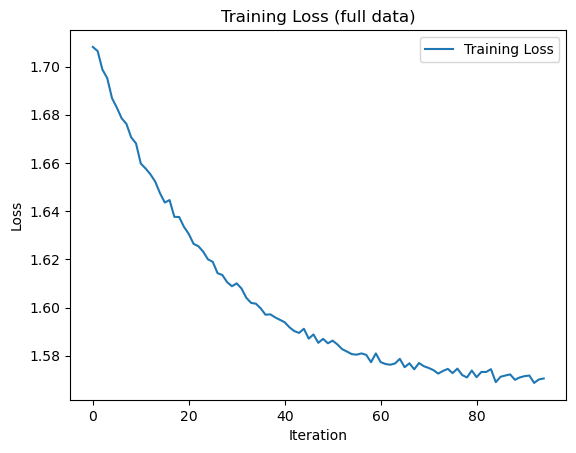

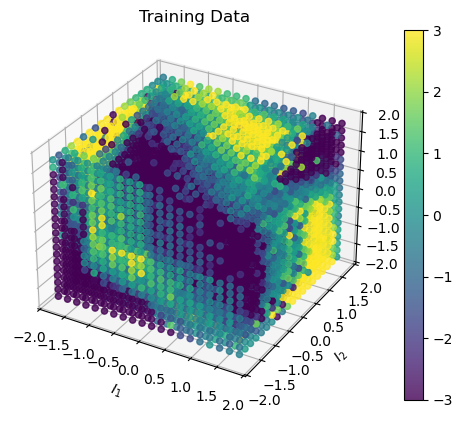

Number of sites: 1, Test R2: -0.4685403213318031
Number of sites: 2, Test R2: 0.7124427624406888
Number of sites: 3, Test R2: 0.7132285177103797
Number of sites: 1, Test R2: -0.817457943195818
Number of sites: 2, Test R2: 0.6481898712936294
Number of sites: 3, Test R2: 0.6466127445470057
Number of sites: 1, Test R2: 0.07185228090215379
Number of sites: 2, Test R2: 0.6001446463963782
Number of sites: 3, Test R2: 0.6018824879752029


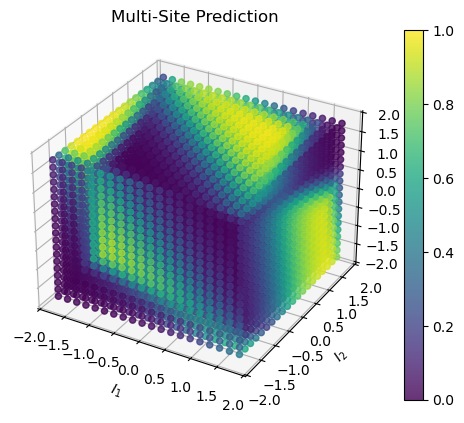

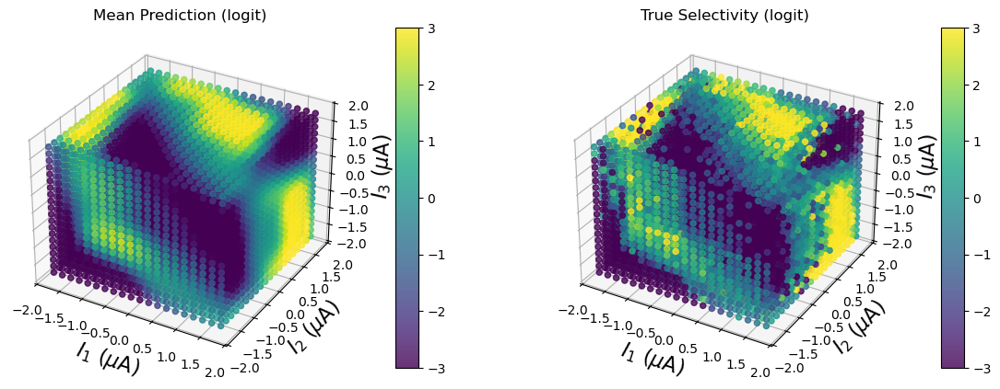

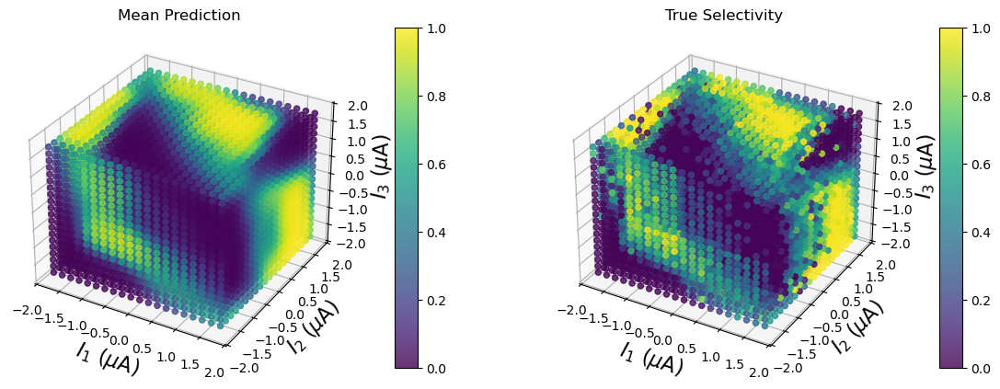

RMSE (full): 0.13602748811867738, RMSE (Multisite, full): 0.17310453387199015
MAE (full): 0.06060101280852062, MAE (Multisite, full): 0.11440595339204057
RMSE (logit, full): 1.7353262422705094, RMSE (Multisite, logit, full): 2.4838871874932082
MAE (logit, full): 1.3523007956908737, MAE (Multisite, logit, full): 2.2159454898076456


In [10]:
selec_probs_full = deepcopy(selectivities[pattern][0])

# Step 1: fitting the GP model

Xdata_full = deepcopy(amps_gsort)
selec_probs_full = np.clip(selec_probs_full, 1e-2, 1-1e-2)
y_full = np.log(selec_probs_full/(1-selec_probs_full))

# Assuming Xdata and y are in numpy format, convert them to torch tensors
amps_plot_torch = torch.tensor(amps_gsort, dtype=torch.float32)
X_train_full = torch.tensor(Xdata_full, dtype=torch.float32)
y_train_full = torch.tensor(y_full.reshape(-1), dtype=torch.float32)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
amps_plot_torch = amps_plot_torch.to(device)
X_train_full = X_train_full.to(device)
y_train_full = y_train_full.to(device)

# Define the GP Model
class GPRegressionModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super(GPRegressionModel, self).__init__(train_x, train_y, likelihood)
        self.mean_constant = ConstantMean()
        # self.mean_linear = LinearMean(input_size=train_x.size(1))
        self.covar_module = RBFKernel()

    def forward(self, x):
        # Add the constant and linear mean components manually
        mean_x = self.mean_constant(x)# + self.mean_linear(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.0):
        """
        :param patience: How many epochs to wait before stopping when loss isn't decreasing.
        :param min_delta: Minimum change in monitored loss to qualify as an improvement.
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.stop = False

    def step(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.stop = True
        else:
            self.best_loss = val_loss
            self.counter = 0

# Initialize the likelihood and model
likelihood_full = GaussianLikelihood()
model_full = GPRegressionModel(X_train_full, y_train_full, likelihood_full)

model_full = model_full.to(device)
likelihood_full = likelihood_full.to(device)

# Set model and likelihood in training mode
model_full.train()
likelihood_full.train()

# Use an optimizer
optimizer_full = torch.optim.AdamW([{'params': model_full.parameters()}], lr=1e-2)

# Set up marginal log likelihood for GPyTorch
mll_full = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood_full, model_full)

# Early stopping setup
early_stopping_full = EarlyStopping(patience=10, min_delta=1e-3)

# Training loop with early stopping
training_iter = 10000
losses_train_full = []
for i in range(training_iter):
    model_full.train()
    likelihood_full.train()
    optimizer_full.zero_grad()
    output_train_full = model_full(X_train_full)

    loss_train_full = -mll_full(output_train_full, y_train_full)

    losses_train_full.append(loss_train_full.item())
    loss_train_full.backward()
    optimizer_full.step()
    early_stopping_full.step(loss_train_full.item())

    if early_stopping_full.stop:
        print(f"Early stopping triggered at iteration {i + 1}")
        break

    if i % 10 == 0:
        print(f"Iteration {i + 1}/{training_iter} - Training Loss: {loss_train_full.item()}")
        print(f"  Lengthscale: {model_full.covar_module.lengthscale}")
        print(f"  Noise: {model_full.likelihood.noise_covar.noise}")

plt.figure()
plt.plot(losses_train_full, label='Training Loss')
plt.legend()
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training Loss (full data)')
plt.show()

# Model evaluation
model_full.eval()
likelihood_full.eval()
with torch.no_grad():
    # Get model predictions
    predictions_full = likelihood_full(model_full(amps_plot_torch))
    mean_full = predictions_full.mean
    var_full = predictions_full.variance
    lower_full, upper_full = predictions_full.confidence_region()

# Plot the raw training data
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$I_1$')
ax.set_ylabel(r'$I_2$')
ax.set_zlabel(r'$I_3$')
ax.set_title('Training Data')

# Scatter plot training data only
scat = ax.scatter(X_train_full.cpu().numpy()[:, 0], 
                X_train_full.cpu().numpy()[:, 1],
                    X_train_full.cpu().numpy()[:, 2], marker='o', c=y_train_full.cpu().numpy(), s=20, alpha=0.8,
                    vmin=-3, vmax=3)

# Add color bar
clb = fig.colorbar(scat, ax=ax)  # Make sure colorbar is linked to the scatter plot
plt.show()

probs_multisite = np.zeros((len(selectivities[pattern][2]), len(amps_gsort)))
for cell_idx in range(len(selectivities[pattern][2])):
    X_sub = deepcopy(amps_gsort)
    probs_fit_sub = deepcopy(selectivities[pattern][2][cell_idx])
    T_sub = deepcopy(max_trials)

    w_inits = []
    for m in ms:
        w_init = np.array(np.random.normal(size=(m, X_sub.shape[1]+1)))
        z = 1 - (1 - zero_prob)**(1/len(w_init))
        w_init[:, 0] = np.clip(w_init[:, 0], None, np.log(z/(1-z)))
        w_init[:, 1:] = np.clip(w_init[:, 1:], -slope_bound, slope_bound)
        w_inits.append(w_init)

    opt, _ = fitting.fit_surface_earlystop(X_sub, probs_fit_sub, T_sub, w_inits,
                                reg_method=reg_method, reg=reg_param, slope_bound=slope_bound,
                                zero_prob=zero_prob, method=method,
                                R2_thresh=R2_thresh, verbose=True                           
    )
    params_subsample, _, _ = opt
    probs_subsample = fitting.sigmoidND_nonlinear(sm.add_constant(amps_gsort, has_constant='add'), 
                                                            params_subsample)
    probs_multisite[cell_idx, :] = probs_subsample

selec_multisite_full = global_selectivity(probs_multisite)
selec_multisite_full = np.clip(selec_multisite_full, 1e-2, 1-1e-2)
selec_multisite_full_logit = np.log(selec_multisite_full/(1-selec_multisite_full))

# Plot the multi-site prediction
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$I_1$')
ax.set_ylabel(r'$I_2$')
ax.set_zlabel(r'$I_3$')
ax.set_title('Multi-Site Prediction')

scat = ax.scatter(amps_gsort[:, 0], 
                amps_gsort[:, 1],
                    amps_gsort[:, 2], marker='o', c=selec_multisite_full, s=20, alpha=0.8,
                    vmin=0, vmax=1)

# Add color bar
clb = fig.colorbar(scat, ax=ax)  # Make sure colorbar is linked to the scatter plot
plt.show()

fig = plt.figure(figsize=(14, 6))
ax = fig.add_subplot(121, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
ax.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
ax.set_title('Mean Prediction (logit)')

# Scatter plot
scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                c=mean_full.cpu().numpy().flatten(), s=20, alpha=0.8,
                vmin=-3, vmax=3)

# Add color bar
cbar = fig.colorbar(scat, ax=ax, shrink=0.8, aspect=15, pad=0.1)

# Panel 2: Subsampled selectivity
ax2 = fig.add_subplot(122, projection='3d')
scat2 = ax2.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                    c=selectivities[pattern][1], marker='o', s=20, alpha=0.8, vmin=-3, vmax=3)
ax2.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
ax2.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
ax2.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
ax2.set_title('True Selectivity (logit)')
cbar2 = fig.colorbar(scat2, ax=ax2, shrink=0.8, aspect=15, pad=0.1)
plt.show()

fig = plt.figure(figsize=(14, 6))
ax = fig.add_subplot(121, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
ax.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
ax.set_title('Mean Prediction')

# Scatter plot
scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                c=1/(1 + np.exp(-mean_full.cpu().numpy().flatten())), s=20, alpha=0.8,
                vmin=0, vmax=1)

# Add color bar
cbar = fig.colorbar(scat, ax=ax, shrink=0.8, aspect=15, pad=0.1)

# Panel 2: Subsampled selectivity
ax2 = fig.add_subplot(122, projection='3d')
scat2 = ax2.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                    c=selectivities[pattern][0], marker='o', s=20, alpha=0.8, vmin=0, vmax=1)
ax2.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
ax2.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
ax2.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
ax2.set_title('True Selectivity')
cbar2 = fig.colorbar(scat2, ax=ax2, shrink=0.8, aspect=15, pad=0.1)
plt.show()

probs_pred_full = 1/(1 + np.exp(-mean_full.cpu().numpy().flatten()))

# Inds where either the prediction or the true selectivity is above the cutoff
selective_inds_full = np.where((selectivities[pattern][1] > lcb_cutoff) | (mean_full.cpu().numpy().flatten() > lcb_cutoff))[0]
selective_inds_full_multisite = np.where((selectivities[pattern][1] > lcb_cutoff) | (selec_multisite_full_logit > lcb_cutoff))[0]

RMSE_full = np.sqrt(np.mean((probs_pred_full[selective_inds_full] - selectivities[pattern][0][selective_inds_full])**2))
RMSE_full_logit = np.sqrt(np.mean((mean_full.cpu().numpy().flatten()[selective_inds_full] - selectivities[pattern][1][selective_inds_full])**2))
RMSE_multisite_full = np.sqrt(np.mean((selec_multisite_full[selective_inds_full_multisite] - selectivities[pattern][0][selective_inds_full_multisite])**2))
RMSE_multisite_full_logit = np.sqrt(np.mean((selec_multisite_full_logit[selective_inds_full_multisite] - selectivities[pattern][1][selective_inds_full_multisite])**2))

MAE_full = np.mean(np.abs(probs_pred_full[selective_inds_full] - selectivities[pattern][0][selective_inds_full]))
MAE_full_logit = np.mean(np.abs(mean_full.cpu().numpy().flatten()[selective_inds_full] - selectivities[pattern][1][selective_inds_full]))
MAE_multisite_full = np.mean(np.abs(selec_multisite_full[selective_inds_full_multisite] - selectivities[pattern][0][selective_inds_full_multisite]))
MAE_multisite_full_logit = np.mean(np.abs(selec_multisite_full_logit[selective_inds_full_multisite] - selectivities[pattern][1][selective_inds_full_multisite]))

print(f'RMSE (full): {RMSE_full}, RMSE (Multisite, full): {RMSE_multisite_full}') 
print(f'MAE (full): {MAE_full}, MAE (Multisite, full): {MAE_multisite_full}')

print(f'RMSE (logit, full): {RMSE_full_logit}, RMSE (Multisite, logit, full): {RMSE_multisite_full_logit}')
print(f'MAE (logit, full): {MAE_full_logit}, MAE (Multisite, logit, full): {MAE_multisite_full_logit}')

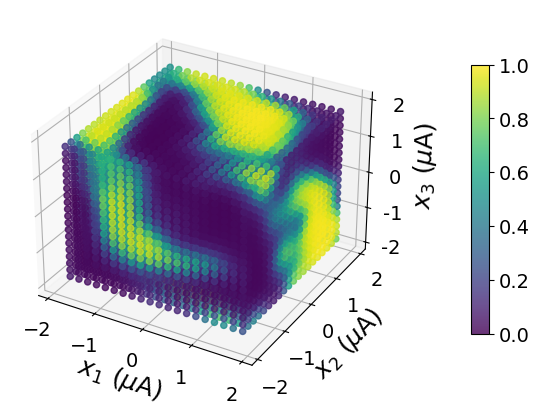

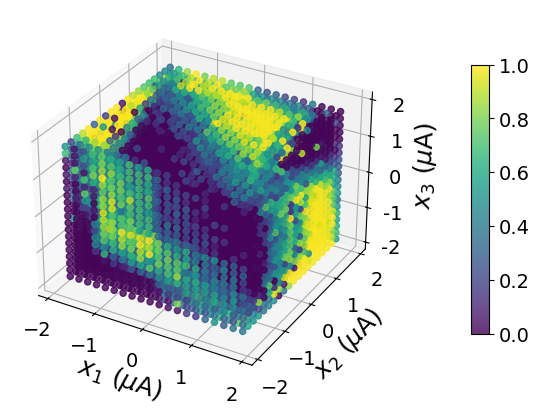

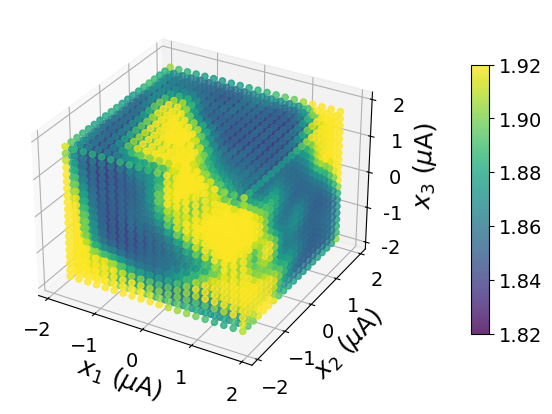

In [11]:
%matplotlib inline

fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$x_1$ ($\mu$A)', fontsize=18)
ax.set_ylabel(r'$x_2$ ($\mu$A)', fontsize=18)
ax.set_zlabel(r'$x_3$ ($\mu$A)', fontsize=18)
ax.set_xlim([-2.2, 2.2])
ax.set_ylim([-2.2, 2.2])
ax.set_zlim([-2.2, 2.2])
plt.xticks([-2, -1, 0, 1, 2], fontsize=14)
plt.yticks([-2, -1, 0, 1, 2], fontsize=14)
# Set z ticks with fontsize 14
ax.set_zticks([-2, -1, 0, 1, 2])
ax.set_zticklabels([-2, -1, 0, 1, 2], fontsize=14)

# ax.set_title('GP Mean Prediction')

# Scatter plot
scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                c=1/(1 + np.exp(-mean.cpu().numpy().flatten())), s=20, alpha=0.8,
                vmin=0, vmax=1)

# Add color bar
cbar = fig.colorbar(scat, ax=ax, shrink=0.7, aspect=15, pad=0.15)
# Set color bar tick labels to be larger
cbar.ax.tick_params(labelsize=14)
plt.show()

fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')

# Set labels and limits
ax.set_xlabel(r'$x_1$ ($\mu$A)', fontsize=18)
ax.set_ylabel(r'$x_2$ ($\mu$A)', fontsize=18)
ax.set_zlabel(r'$x_3$ ($\mu$A)', fontsize=18)
ax.set_xlim([-2.2, 2.2])
ax.set_ylim([-2.2, 2.2])
ax.set_zlim([-2.2, 2.2])
plt.xticks([-2, -1, 0, 1, 2], fontsize=14)
plt.yticks([-2, -1, 0, 1, 2], fontsize=14)
# Set z ticks with fontsize 14
ax.set_zticks([-2, -1, 0, 1, 2])
ax.set_zticklabels([-2, -1, 0, 1, 2], fontsize=14)

scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                    c=selectivities[pattern][0], marker='o', s=20, alpha=0.8, vmin=0, vmax=1)

# Add color bar
cbar = fig.colorbar(scat, ax=ax, shrink=0.7, aspect=15, pad=0.15)
# Set color bar tick labels to be larger
cbar.ax.tick_params(labelsize=14)
plt.show()

fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$x_1$ ($\mu$A)', fontsize=18)
ax.set_ylabel(r'$x_2$ ($\mu$A)', fontsize=18)
ax.set_zlabel(r'$x_3$ ($\mu$A)', fontsize=18)
ax.set_xlim([-2.2, 2.2])
ax.set_ylim([-2.2, 2.2])
ax.set_zlim([-2.2, 2.2])
plt.xticks([-2, -1, 0, 1, 2], fontsize=14)
plt.yticks([-2, -1, 0, 1, 2], fontsize=14)
# Set z ticks with fontsize 14
ax.set_zticks([-2, -1, 0, 1, 2])
ax.set_zticklabels([-2, -1, 0, 1, 2], fontsize=14)

scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                c=np.sqrt(var.cpu().numpy().flatten()), 
                s=20, alpha=0.8,
                vmin=1.82, vmax=1.92)

# Add color bar
cbar = fig.colorbar(scat, ax=ax, shrink=0.7, aspect=15, pad=0.15)
# Set color bar tick labels to be larger
cbar.ax.tick_params(labelsize=14)
plt.show()

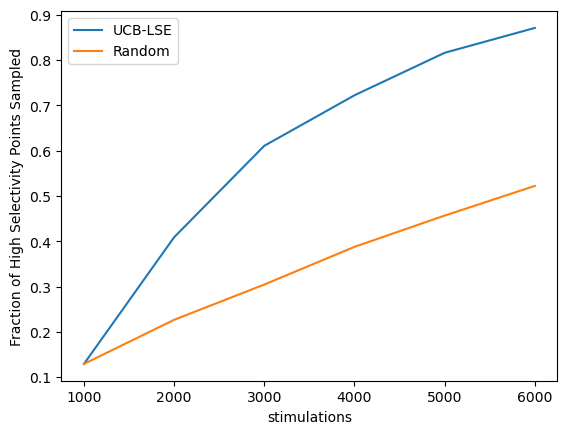

In [12]:
%matplotlib inline

plt.figure()
plt.plot(np.array(num_samples), success_fractions, label='UCB-LSE')
plt.plot(np.array(num_samples_random), success_fractions_random, label='Random')
plt.legend()
plt.xlabel('stimulations')
plt.ylabel('Fraction of High Selectivity Points Sampled')
plt.show()

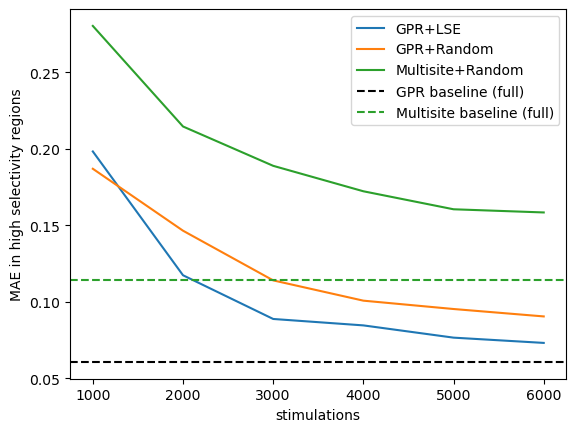

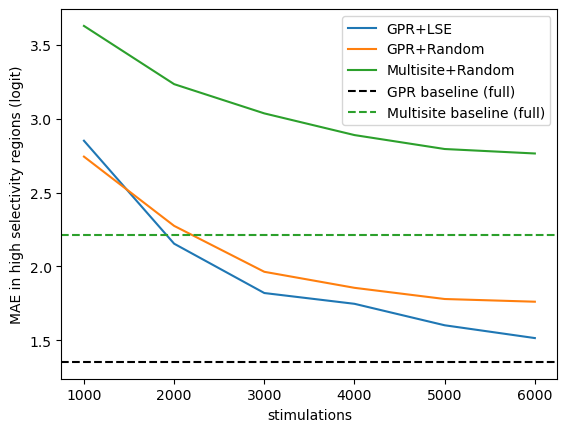

In [13]:
plt.figure()
plt.plot(np.array(num_samples), MAEs, label='GPR+LSE')
plt.plot(np.array(num_samples_random), MAEs_random, label='GPR+Random')
plt.plot(np.array(num_samples), MAEs_multisite, label='Multisite+Random')
plt.axhline(y=MAE_full, color='k', linestyle='--', label='GPR baseline (full)')
plt.axhline(y=MAE_multisite_full, color='tab:green', linestyle='--', label='Multisite baseline (full)')
plt.legend()
plt.xlabel('stimulations')
plt.ylabel('MAE in high selectivity regions')
plt.show()

plt.figure()
plt.plot(np.array(num_samples), MAEs_logit, label='GPR+LSE')
plt.plot(np.array(num_samples_random), MAEs_random_logit, label='GPR+Random')
plt.plot(np.array(num_samples), MAEs_multisite_logit, label='Multisite+Random')
plt.axhline(y=MAE_full_logit, color='k', linestyle='--', label='GPR baseline (full)')
plt.axhline(y=MAE_multisite_full_logit, color='tab:green', linestyle='--', label='Multisite baseline (full)')
plt.legend()
plt.xlabel('stimulations')
plt.ylabel('MAE in high selectivity regions (logit)')
plt.show()

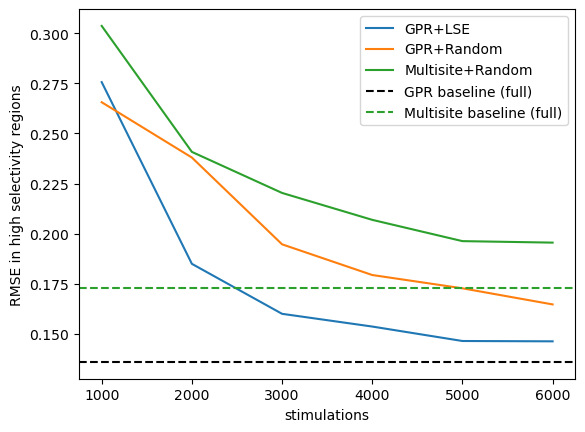

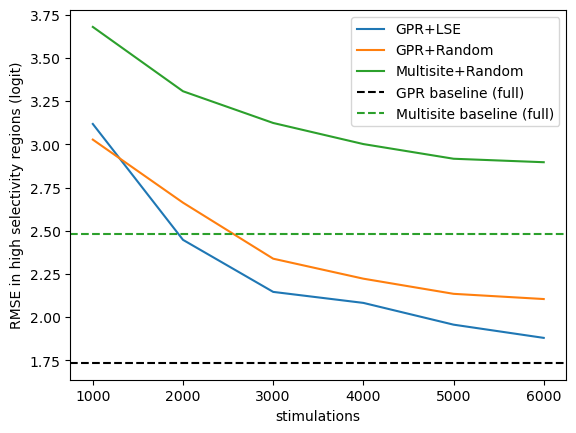

In [14]:
plt.figure()
plt.plot(np.array(num_samples), RMSEs, label='GPR+LSE')
plt.plot(np.array(num_samples_random), RMSEs_random, label='GPR+Random')
plt.plot(np.array(num_samples), RMSEs_multisite, label='Multisite+Random')
plt.axhline(y=RMSE_full, color='k', linestyle='--', label='GPR baseline (full)')
plt.axhline(y=RMSE_multisite_full, color='tab:green', linestyle='--', label='Multisite baseline (full)')
plt.legend()
plt.xlabel('stimulations')
plt.ylabel('RMSE in high selectivity regions')
plt.show()

plt.figure()
plt.plot(np.array(num_samples), RMSEs_logit, label='GPR+LSE')
plt.plot(np.array(num_samples_random), RMSEs_random_logit, label='GPR+Random')
plt.plot(np.array(num_samples), RMSEs_multisite_logit, label='Multisite+Random')
plt.axhline(y=RMSE_full_logit, color='k', linestyle='--', label='GPR baseline (full)')
plt.axhline(y=RMSE_multisite_full_logit, color='tab:green', linestyle='--', label='Multisite baseline (full)')
plt.legend()
plt.xlabel('stimulations')
plt.ylabel('RMSE in high selectivity regions (logit)')
plt.show()